# ECONOMIC GROWTH PATTERNS - REMEDIES FOR DEVELOPING COUNTRIES

## Introduction

This project aims to understand the growth patterns of the global coutries and analyze the similarities in development patterns using economic attributes. This will be a comprehensive study using the following features: GDP, HDI Index, Life expectancy, Gini index, Economic freedom index.


The objective in performing this analysis is to understand the relative position in which India stands in today's world, what are the factors India is lacking behind and to find inspiration from countries which were once/currently in a similar state and how did they overcome these constraints to become a better economy.




**Glosssary:**

**Life Expectancy**– Measures the average number of years a person is expected to live. A higher life expectancy indicates better healthcare and living standards, leading to a healthier workforce, increased productivity, and long-term economic growth.

**Human Development Index (HDI**) – A composite measure of life expectancy, education, and per capita income. A higher HDI reflects better quality of life and human capital, boosting innovation, economic stability, and global competitiveness.

**Gross Domestic Product (GDP)**– The total value of goods and services produced within a country. It is a key indicator of economic health, influencing employment, investment, and overall national prosperity.

**Population** – The total number of people in a country. A growing population can provide a larger workforce and market demand but may also strain resources and infrastructure if not managed effectively.

**Gini Coefficient** – Measures income inequality on a scale from 0 (perfect equality) to 1 (maximum inequality). High inequality can lead to social unrest, lower economic mobility, and reduced consumer spending, impacting long-term growth.

**Economic Freedom Index** – Assesses a country’s economic policies regarding business freedom, trade, and property rights. Higher economic freedom fosters entrepreneurship, investment, and innovation, leading to stronger economic performance.

**Layout of the project:**

1. Load the Datasets
2. create custom dataframes
3. Merge coutnries, gdp : merge 1
4. Merge hdi, gini, le: merge 2
5. merge the former to countries: merge 3
6. merge the former with custom df using conditions: merge 4
7. visualize for India, draw insights
8. drop down to select country, plot all parameters over time
9. find countries which aligns with the motto of India
10. Understand and visualize the growth of such countries
11. perform hypothesis testing
12. perform clustering by incorporating time series
13. Open to more visualization
14.  Reshape the GDP data using Melt and select data only for 2023 (latest available year)

15. Use Fuzzywuzzy to match the Country names in the GDP data and Population data

16. Calculate per capita income using gdp and population

17. Visualize and interpret the results pertaining to the GDP Per capita

18. Extract World Bank categorization of regions and Find the Max, Min and Median Scores for the metrics based on the region

19. Consider the Economic freedom index of 2023 and merge

20. Use EDA tools: Profiling and Sweetviz

21. Now perform Agglomerative Clustering to identify and visualize the economic clusters across the world.

## Data Sources and other references

1. world countries shapefile
https://public.opendatasoft.com/explore/dataset/world-administrative-boundaries/export/?flg=en-us

2. life expectancy
https://ourworldindata.org/life-expectancy

3. gdp for world countries
https://databank.worldbank.org/reports.aspx?source=2&series=NY.GDP.MKTP.CD#

4. index of economic freedom
https://www.heritage.org/index/pages/all-country-scores

5. Gini Index
https://ourworldindata.org/grapher/economic-inequality-gini-index?tab=table

6. Human Devlopment Index
https://ourworldindata.org/grapher/human-development-index

In [ ]:
# Install if not already installed
!pip install rapidfuzz
!pip install ipywidgets --quiet
!pip install sweetviz --quiet
!pip install gdown --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 21.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 18.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 44.7 MB/s eta 0:00:00


In [ ]:
# Import all the necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
from google.colab import files
import os
import glob
import ipywidgets as widgets
from IPython.display import display
import gdown
from rapidfuzz import process, fuzz
from IPython.display import display, clear_output


# Data Extraction

## Dataframes from drive

In [ ]:
# Load all the dataframes from the google drive folder to directly pull from the folder.
# There are 6 dataframes in the folder: World countries shapefile will be used as the fact table or the centre of the schema
# There can be discrepancies in the list of countries by each organization, we will however consider Countries df as main reference for data cleaning
# The other tables will be merged with the Countries file using 1:m relation, which are as follows:
# 1. life expectancy, 2. GDP, 3. HDI Index, 4 Gini Index, 5. Economic freedom

# Note: the below code might take upto 5 minutes to run.

In [ ]:
# Shared folder link
shared_folder_link = "https://drive.google.com/drive/folders/1UVB2g_roRFRLlumbp74BPQJVoVUoih-0?usp=sharing"
folder_id = shared_folder_link.split("folders/")[-1].split("?")[0]  # Extract folder ID

# Output folder for downloaded files
output_folder = "datasets"
os.makedirs(output_folder, exist_ok=True)

# Fetch files from Google Drive folder
gdown.download_folder(f"https://drive.google.com/drive/folders/{folder_id}", output=output_folder, quiet=False)

# List all dataset files (CSV, Excel)
files = glob.glob(os.path.join(output_folder, "*"))

print("\n📂 Files Found in 'DATMAN NEW PROJECT':")
for file in files:
    print(file)

# Read and store datasets as DataFrames with original file names
dataframes = {}
for file in files:
    file_name = os.path.basename(file).split(".")[0]  # Extract file name (without extension)
    if file.endswith(".csv"):
        dataframes[file_name] = pd.read_csv(file)
    elif file.endswith(".xlsx") or file.endswith(".xls"):
        dataframes[file_name] = pd.read_excel(file)

# Display loaded DataFrames' names and shapes
print("\n📌 Loaded DataFrames:")
for name, df in dataframes.items():
    print(f"🔹 {name} (Shape: {df.shape})")
    display(df.head())


Retrieving folder contents


Processing file 1el8uDkDiCMqEFc0t-IVoLoEvers-uuf9 df1 World countries adn shapefile.xlsx
Processing file 1YlO4OGo9xdHdvj20-mIloRcNTvjz7F8C df2 life-expectancy.csv
Processing file 1yR4hnW8vfnO7CHnbp81r0MRUDhmm9huR df3 World country GDP all years.xlsx
Processing file 1fdACn-mw66tbolXocAxKR-_eNbD6ZGsa df4 human-development-index.csv
Processing file 1qeq7NLb8qo9pLdQQDKucNTGV3bbUN1rl df5 gini-coefficient-wid-vs-pip.csv
Processing file 1XhBTz7TAljW3bz0N6fmC1AL6L5c99xzL df6 2024_indexofeconomicfreedom_data.xlsx
Processing file 15vQ3xl3FuA98U_0TUbJrA5HMk_DQh4Hd df7_gdp_merged_data.xlsx
Processing file 1CmcaltfcKUrbAwM6xM56OgHWR7FvVjm3 df8_hdi_gin_le_inner.xlsx
Processing file 19EtbOtMa7vLxVH0F77OTK1w8kuNLc_i5 df9_final_merged.xlsx
Processing file 1BpcbEy_4rknGK_4iPv2Llnkm7i4Y275A heritage-index-of-economic-freedom-20250323122350.csv


Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1el8uDkDiCMqEFc0t-IVoLoEvers-uuf9
To: /content/datasets/df1 World countries adn shapefile.xlsx
100%|██████████| 1.09M/1.09M [00:00<00:00, 15.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1YlO4OGo9xdHdvj20-mIloRcNTvjz7F8C
To: /content/datasets/df2 life-expectancy.csv
100%|██████████| 622k/622k [00:00<00:00, 7.51MB/s]
Downloading...
From: https://drive.google.com/uc?id=1yR4hnW8vfnO7CHnbp81r0MRUDhmm9huR
To: /content/datasets/df3 World country GDP all years.xlsx
100%|██████████| 146k/146k [00:00<00:00, 4.46MB/s]
Downloading...
From: https://drive.google.com/uc?id=1fdACn-mw66tbolXocAxKR-_eNbD6ZGsa
To: /content/datasets/df4 human-development-index.csv
100%|██████████| 165k/165k [00:00<00:00, 3.27MB/s]
Downloading...
From: https://drive.google.com/uc?id=1qeq7NLb8qo9pLdQQDKucNTGV3bbUN1rl
To: /content/datasets/df5 gini-coeffici


📂 Files Found in 'DATMAN NEW PROJECT':
datasets/df1 World countries adn shapefile.xlsx
datasets/df4 human-development-index.csv
datasets/df2 life-expectancy.csv
datasets/df9_final_merged.xlsx
datasets/heritage-index-of-economic-freedom-20250323122350.csv
datasets/df6 2024_indexofeconomicfreedom_data.xlsx
datasets/df3 World country GDP all years.xlsx
datasets/df5 gini-coefficient-wid-vs-pip.csv
datasets/df8_hdi_gin_le_inner.xlsx
datasets/df7_gdp_merged_data.xlsx

📌 Loaded DataFrames:
🔹 df1 World countries adn shapefile (Shape: (256, 5))


,Geo Point,Geo Shape,ISO 3 country code,English Name,Continent of the territory
0,"1.2799634451787583, 32.38621827281175","{""coordinates"":[[[33.92110000000008,-1.0019399...",UGA,Uganda,Africa
1,"41.75044402910113, 63.169364370421164","{""coordinates"":[[[70.97081000000009,42.2546700...",UZB,Uzbekistan,Asia
2,"53.1763816282643, -8.150578960214018","{""coordinates"":[[[[-9.970139999999958,54.02083...",IRL,Ireland,Europe
3,"15.373203130370355, 38.84128573461554","{""coordinates"":[[[[40.135830000000055,15.75250...",ERI,Eritrea,Africa
4,"21.892740179494872, 33.74379108021756","{""coordinates"":[[[33.251040000000046,21.999770...",EGY,Ma'tan al-Sarra,Africa


🔹 df4 human-development-index (Shape: (6464, 4))


,Entity,Code,Year,Human Development Index
0,Afghanistan,AFG,1990,0.284
1,Afghanistan,AFG,1991,0.292
2,Afghanistan,AFG,1992,0.299
3,Afghanistan,AFG,1993,0.307
4,Afghanistan,AFG,1994,0.300


🔹 df2 life-expectancy (Shape: (21565, 4))


,Entity,Code,Year,Life Expectancy at birth
0,Afghanistan,AFG,1950,28.1563
1,Afghanistan,AFG,1951,28.5836
2,Afghanistan,AFG,1952,29.0138
3,Afghanistan,AFG,1953,29.4521
4,Afghanistan,AFG,1954,29.6975


🔹 df9_final_merged (Shape: (7410, 12))


,Geo Point,Geo Shape,Code,English Name,Continent of the territory,Region of the territory,Year,Human Development Index,Gini coefficient (Post-tax national) (Estimated),Gini coefficient,Population (historical),Life Expectancy at birth
0,"12.515627383711797, -69.97564122076227","{""coordinates"":[[[-69.8748599999999,12.4152800...",ABW,Aruba,Americas,Caribbean,NaN,NaN,NaN,NaN,NaN,NaN
1,"33.838805716206636, 66.0264706677288","{""coordinates"":[[[74.91574000000008,37.2373300...",AFG,Afghanistan,Asia,Southern Asia,1990.0,0.284,0.520095,NaN,12045664.0,45.1183
2,"33.838805716206636, 66.0264706677288","{""coordinates"":[[[74.91574000000008,37.2373300...",AFG,Afghanistan,Asia,Southern Asia,1991.0,0.292,0.520115,NaN,12238879.0,45.5207
3,"33.838805716206636, 66.0264706677288","{""coordinates"":[[[74.91574000000008,37.2373300...",AFG,Afghanistan,Asia,Southern Asia,1992.0,0.299,0.520155,NaN,13278982.0,46.5691
4,"33.838805716206636, 66.0264706677288","{""coordinates"":[[[74.91574000000008,37.2373300...",AFG,Afghanistan,Asia,Southern Asia,1993.0,0.307,0.520154,NaN,14943174.0,51.0212


🔹 heritage-index-of-economic-freedom-20250323122350 (Shape: (184, 15))


,Country,Index Year,Overall Score,Property Rights,Government Integrity,Judicial Effectiveness,Tax Burden,Government Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom
0,Afghanistan,2023,NaN,5.8,5.4,12.7,NaN,NaN,NaN,34.6,45.1,NaN,NaN,NaN,NaN
1,Albania,2023,65.3,55.9,49.2,35.5,89.1,71.0,58.2,70.7,49.7,81.3,82.8,70.0,70.0
2,Algeria,2023,43.2,27.8,29.5,28.4,71.9,50.7,12.1,53.6,51.4,75.1,57.5,30.0,30.0
3,Angola,2023,53.0,41.1,24.8,22.9,86.5,86.9,85.1,41.6,53.9,58.9,64.8,30.0,40.0
4,Argentina,2023,51.0,34.6,56.8,42.8,66.9,53.9,33.6,55.5,55.1,36.5,61.2,55.0,60.0


🔹 df6 2024_indexofeconomicfreedom_data (Shape: (184, 14))


,Country,Overall Score,Property Rights,Government Integrity,Judicial Effectiveness,Tax Burden,Government Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom
0,Afghanistan,NaN,4.9,18.1,4.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Albania,64.8,56.8,36.6,50.0,88.8,69.8,51.7,74.1,51.5,75.7,82.6,70.0,70.0
2,Algeria,43.9,27.5,27.7,28.9,79.4,54.7,13.8,54.4,51.4,71.9,57.4,30.0,30.0
3,Angola,54.3,40.4,27.8,25.7,86.5,85.8,91.1,44.6,50.8,60.0,68.6,30.0,40.0
4,Argentina,49.9,34.5,39.8,55.8,67.0,54.3,35.7,55.5,53.5,29.4,58.6,55.0,60.0


🔹 df3 World country GDP all years (Shape: (266, 39))


,Country Name,Country Code,1967 [YR1967],1968 [YR1968],1969 [YR1969],1970 [YR1970],1971 [YR1971],1972 [YR1972],1973 [YR1973],1974 [YR1974],...,2014 [YR2014],2015 [YR2015],2016 [YR2016],2017 [YR2017],2018 [YR2018],2019 [YR2019],2020 [YR2020],2021 [YR2021],2022 [YR2022],2023 [YR2023]
0,Afghanistan,AFG,..,..,..,..,..,..,..,..,...,20497128555.697231,19134221644.732494,18116572395.077213,18753456497.815865,18053222687.412624,18799444490.112782,19955929052.149597,14259995441.075907,14497243872.133739,17233051620.111732
1,Albania,ALB,..,..,..,..,..,..,..,..,...,13228147516.116798,11386853113.0189,11861199830.83956,13019726211.736889,15379509891.719603,15585105131.064415,15241458744.868845,18032010563.755798,19017242585.780338,23547179830.441257
2,Algeria,DZA,3370870376.296824,3852147026.773019,4257253264.088344,4863526896.574075,5077183093.889678,6766743956.888885,8707858912.124809,13209871625.904444,...,238942664192.589996,187493855609.344635,180763839522.150818,189880896903.073303,194554483655.52774,193459662090.676819,164873415325.201477,186231205262.082367,225638456572.142761,247626161016.414459
3,American Samoa,ASM,..,..,..,..,..,..,..,..,...,643000000,673000000,671000000,612000000,639000000,647000000,721000000,750000000,871000000,..
4,Andorra,AND,..,..,..,78617711.096533,89406608.145815,113414397.365635,150841639.297444,186557081.998137,...,3271685596.663211,2789881258.503616,2896610479.730765,3000162081.119757,3218419896.964102,3155149347.806392,2891001149.361105,3324647529.380999,3380612573.329216,3785067331.762496


🔹 df5 gini-coefficient-wid-vs-pip (Shape: (60734, 6))


,Entity,Code,Year,Gini coefficient (Post-tax national) (Estimated),Gini coefficient,Population (historical)
0,Afghanistan,AFG,1980,0.519921,NaN,13169312.0
1,Afghanistan,AFG,1981,0.519936,NaN,11937587.0
2,Afghanistan,AFG,1982,0.519852,NaN,10991382.0
3,Afghanistan,AFG,1983,0.519883,NaN,10917986.0
4,Afghanistan,AFG,1984,0.519923,NaN,11190220.0


🔹 df8_hdi_gin_le_inner (Shape: (815096, 8))


,Entity,Code,Year,Human Development Index,Gini coefficient (Post-tax national) (Estimated),Gini coefficient,Population (historical),Life Expectancy at birth
0,Afghanistan,AFG,1990,0.284,0.520095,NaN,12045664.0,45.1183
1,Afghanistan,AFG,1991,0.292,0.520115,NaN,12238879.0,45.5207
2,Afghanistan,AFG,1992,0.299,0.520155,NaN,13278982.0,46.5691
3,Afghanistan,AFG,1993,0.307,0.520154,NaN,14943174.0,51.0212
4,Afghanistan,AFG,1994,0.300,0.520115,NaN,16250799.0,50.9689


🔹 df7_gdp_merged_data (Shape: (256, 46))


,Geo Point,Geo Shape,ISO 3 country code,English Name,Continent of the territory,Region of the territory,Country Name,Country Code,1967 [YR1967],1968 [YR1968],...,2015 [YR2015],2016 [YR2016],2017 [YR2017],2018 [YR2018],2019 [YR2019],2020 [YR2020],2021 [YR2021],2022 [YR2022],2023 [YR2023],_merge
0,"1.2799634451787583, 32.38621827281175","{""coordinates"":[[[33.92110000000008,-1.0019399...",UGA,Uganda,Africa,Eastern Africa,Uganda,UGA,967240655.186896,1037379252.414952,...,32387183730.100151,29203988696.262619,30744473841.423988,32927025619.67955,35348155095.421463,37600368241.665733,40529788748.673691,45565333210.910789,48768955863.31749,both
1,"41.75044402910113, 63.169364370421164","{""coordinates"":[[[70.97081000000009,42.2546700...",UZB,Uzbekistan,Asia,Central Asia,Uzbekistan,UZB,..,..,...,86196264755.310532,86138288644.17099,69703222282.727844,58695899092.10833,67293639798.399582,66443265418.308647,77340060003.034698,90095926567.435898,101591769702.343201,both
2,"53.1763816282643, -8.150578960214018","{""coordinates"":[[[[-9.970139999999958,54.02083...",IRL,Ireland,Europe,Northern Europe,Ireland,IRL,3445739914.73101,3378701146.841974,...,302391428540.034729,305733136180.906982,348532394023.594727,395461216460.417725,407124824064.995422,436555518400.450989,531306516907.983704,548570250341.986572,551394889339.77832,both
3,"15.373203130370355, 38.84128573461554","{""coordinates"":[[[[40.135830000000055,15.75250...",ERI,Eritrea,Africa,Eastern Africa,Eritrea,ERI,..,..,...,..,..,..,..,..,..,..,..,..,both
4,"21.892740179494872, 33.74379108021756","{""coordinates"":[[[33.251040000000046,21.999770...",EGY,Ma'tan al-Sarra,Africa,Northern Africa,"Egypt, Arab Rep.",EGY,5605484298.982751,5932242990.654205,...,329366576819.406982,332441717791.411011,248362771739.130402,262588632526.730408,318678815489.749512,383817841547.099182,424671765455.704285,476747720364.741577,396002496996.959717,both


# Merging

## Countries and GDP

In [ ]:
# Load df1 and df3 from Google Drive (Already Loaded)
df1_World_countries_and_shapefile = pd.read_excel("/content/datasets/df1 World countries adn shapefile.xlsx")
df3_World_country_GDP_all_years = pd.read_excel("/content/datasets/df3 World country GDP all years.xlsx")
df4_hdi = pd.read_csv('/content/datasets/df4 human-development-index.csv')
df5_gini = pd.read_csv('/content/datasets/df5 gini-coefficient-wid-vs-pip.csv')
df2_life = pd.read_csv('/content/datasets/df2 life-expectancy.csv')


In [ ]:
# Get Unique Country Codes in Each Dataset
df1_country_codes = set(df1_World_countries_and_shapefile["ISO 3 country code"].dropna().unique())  # df1 country codes
df3_country_codes = set(df3_World_country_GDP_all_years["Country Code"].dropna().unique())  # df3 country code

In [ ]:
# Reshape `df3_World_country_GDP_all_years` (Wide → Long Format)
df3_long = df3_World_country_GDP_all_years.melt(
    id_vars=["Country Name", "Country Code"],
    var_name="Year",
    value_name="GDP"
)

# Extract year values (e.g., "2010 [YR2010]" → "2010") and convert to integer
df3_long["Year"] = df3_long["Year"].str.extract("(\d+)").astype(int)

# Perform Outer Merge on `Country Code` with `indicator=True`
df_gdp_outer_merged = df3_long.merge(df3_World_country_GDP_all_years, on="Country Code", how="outer", indicator=True)

In [ ]:
df_gdp_outer_merged.head()


,Country Name_x,Country Code,Year,GDP,Country Name_y,1967 [YR1967],1968 [YR1968],1969 [YR1969],1970 [YR1970],1971 [YR1971],...,2015 [YR2015],2016 [YR2016],2017 [YR2017],2018 [YR2018],2019 [YR2019],2020 [YR2020],2021 [YR2021],2022 [YR2022],2023 [YR2023],_merge
0,Aruba,ABW,1967,..,Aruba,..,..,..,..,..,...,2962907262.569832,2983635195.530726,3092429050.27933,3276184357.541899,3395798882.681564,2481857122.8401,2929446578.251045,3279343543.604156,3648573136.151547,both
1,Aruba,ABW,1968,..,Aruba,..,..,..,..,..,...,2962907262.569832,2983635195.530726,3092429050.27933,3276184357.541899,3395798882.681564,2481857122.8401,2929446578.251045,3279343543.604156,3648573136.151547,both
2,Aruba,ABW,1969,..,Aruba,..,..,..,..,..,...,2962907262.569832,2983635195.530726,3092429050.27933,3276184357.541899,3395798882.681564,2481857122.8401,2929446578.251045,3279343543.604156,3648573136.151547,both
3,Aruba,ABW,1970,..,Aruba,..,..,..,..,..,...,2962907262.569832,2983635195.530726,3092429050.27933,3276184357.541899,3395798882.681564,2481857122.8401,2929446578.251045,3279343543.604156,3648573136.151547,both
4,Aruba,ABW,1971,..,Aruba,..,..,..,..,..,...,2962907262.569832,2983635195.530726,3092429050.27933,3276184357.541899,3395798882.681564,2481857122.8401,2929446578.251045,3279343543.604156,3648573136.151547,both


In [ ]:
# Identify Non-Matching Records
non_matching_left = df_gdp_outer_merged[df_gdp_outer_merged["_merge"] == "left_only"]  # Only in `df3_long`
non_matching_right = df_gdp_outer_merged[df_gdp_outer_merged["_merge"] == "right_only"]  # Only in `df3_World_country_GDP_all_years`

# Identify Country Codes in df3 but NOT in df1 (Extra in GDP dataset)
missing_in_df1 = df3_country_codes - df1_country_codes

# Identify Country Codes in df1 but NOT in df3 (Extra in Shapefile dataset)
missing_in_df3 = df1_country_codes - df3_country_codes

# Print the Findings
print("\n📌 Country Codes in df3 (GDP Data) but NOT in df1 (Shapefile):")
print(sorted(missing_in_df1))  # Countries with GDP but missing from shapefile

print("\n📌 Country Codes in df1 (Shapefile) but NOT in df3 (GDP Data):")
print(sorted(missing_in_df3))  # Countries in shapefile but missing GDP



📌 Country Codes in df3 (GDP Data) but NOT in df1 (Shapefile):
['AFE', 'AFW', 'ARB', 'CEB', 'CHI', 'CSS', 'CUW', 'CYM', 'EAP', 'EAR', 'EAS', 'ECA', 'ECS', 'EMU', 'EUU', 'FCS', 'FRO', 'GIB', 'GRL', 'HIC', 'HKG', 'HPC', 'IBD', 'IBT', 'IDA', 'IDB', 'IDX', 'IMN', 'INX', 'LAC', 'LCN', 'LDC', 'LIC', 'LMC', 'LMY', 'LTE', 'MAC', 'MAF', 'MEA', 'MIC', 'MNA', 'MNP', 'NAC', 'NCL', 'OED', 'OSS', 'PRE', 'PRI', 'PSE', 'PSS', 'PST', 'PYF', 'SAS', 'SSA', 'SSF', 'SST', 'SXM', 'TCA', 'TEA', 'TEC', 'TLA', 'TMN', 'TSA', 'TSS', 'UMC', 'VGB', 'VIR', 'WLD', 'XKX']

📌 Country Codes in df1 (Shapefile) but NOT in df3 (GDP Data):
['AIA', 'ESH', 'IOT', 'TKL', 'VAT', 'XXX', 'XXY', 'XXZ']


Note that the Reference Countries dataframe has 256 countries whereas the GDP dataframe has 266 countries.

It is important to note that it is not only a discrepancy of 10 countries. GDP df has over 40 unique codes which correspond to economic and geographical clusters like Eurpoean Union, OECD, Central Africa, Carribean and so on. Our study does not need these cluster of countries and we limit ourselves to just individual countries.

In [ ]:
# Ensure Data Types Are Consistent
df1_World_countries_and_shapefile["ISO 3 country code"] = df1_World_countries_and_shapefile["ISO 3 country code"].astype(str).str.strip()
df3_World_country_GDP_all_years["Country Code"] = df3_World_country_GDP_all_years["Country Code"].astype(str).str.strip()

# Perform Left Merge (df1 as Reference)
df_gdp_merged = df1_World_countries_and_shapefile.merge(
    df3_World_country_GDP_all_years,
    left_on="ISO 3 country code",
    right_on="Country Code",
    how="left",
    indicator=True  # Track merge status
)


In [ ]:
print("Final Merged GDP Dataset Shape:", df_gdp_merged.shape)

df_gdp_merged.head()

Final Merged GDP Dataset Shape: (256, 45)


,Geo Point,Geo Shape,ISO 3 country code,English Name,Continent of the territory,Country Name,Country Code,1967 [YR1967],1968 [YR1968],1969 [YR1969],...,2015 [YR2015],2016 [YR2016],2017 [YR2017],2018 [YR2018],2019 [YR2019],2020 [YR2020],2021 [YR2021],2022 [YR2022],2023 [YR2023],_merge
0,"1.2799634451787583, 32.38621827281175","{""coordinates"":[[[33.92110000000008,-1.0019399...",UGA,Uganda,Africa,Uganda,UGA,967240655.186896,1037379252.414952,1168556628.867423,...,32387183730.100151,29203988696.262615,30744473841.423988,32927025619.679546,35348155095.421455,37600368241.665733,40529788748.673691,45565333210.910789,48768955863.31749,both
1,"41.75044402910113, 63.169364370421164","{""coordinates"":[[[70.97081000000009,42.2546700...",UZB,Uzbekistan,Asia,Uzbekistan,UZB,..,..,..,...,86196264755.310532,86138288644.17099,69703222282.727844,58695899092.10833,67293639798.399582,66443265418.308647,77340060003.034698,90095926567.435898,101591769702.343155,both
2,"53.1763816282643, -8.150578960214018","{""coordinates"":[[[[-9.970139999999958,54.02083...",IRL,Ireland,Europe,Ireland,IRL,3445739914.73101,3378701146.841974,3902721631.546635,...,302391428540.034668,305733136180.906982,348532394023.594727,395461216460.417725,407124824064.995422,436555518400.450989,531306516907.983704,548570250341.986572,551394889339.77832,both
3,"15.373203130370355, 38.84128573461554","{""coordinates"":[[[[40.135830000000055,15.75250...",ERI,Eritrea,Africa,Eritrea,ERI,..,..,..,...,..,..,..,..,..,..,..,..,..,both
4,"21.892740179494872, 33.74379108021756","{""coordinates"":[[[33.251040000000046,21.999770...",EGY,Ma'tan al-Sarra,Africa,"Egypt, Arab Rep.",EGY,5605484298.982751,5932242990.654205,6524455205.811138,...,329366576819.406982,332441717791.411011,248362771739.130432,262588632526.730438,318678815489.749451,383817841547.099182,424671765455.704285,476747720364.741638,396002496996.959656,both


In [ ]:
# Save DataFrame to an Excel file
df_gdp_merged.to_excel("df_gdp_merged_data.xlsx", index=False)

# Download the file
from google.colab import files
files.download("df_gdp_merged_data.xlsx")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Identify Non-Matching Records (Countries in df1 with No GDP Data)
non_matching_left = df_gdp_merged[df_gdp_merged["_merge"] == "left_only"]

print("\n📌 Countries in df1 that DID NOT match with df3 (No GDP Data Available):")
print(non_matching_left[["ISO 3 country code", "English Name"]].head(10))


📌 Countries in df1 that DID NOT match with df3 (No GDP Data Available):
    ISO 3 country code                    English Name
12                 VAT                        Holy See
24                 XXZ                   Jammu-Kashmir
31                 XXX                 Paracel Islands
38                 nan                           Abyei
47                 ESH                  Western Sahara
48                 TKL                         Tokelau
80                 XXY                      Aksai Chin
105                XXX                 Spratly Islands
119                XXX                       West Bank
173                IOT  British Indian Ocean Territory


On the similar note, there are territories in the reference countries dataframe which are disputed. For example, Aksai Chin and Jammu Kashmir are territories of India partially or fully occupied by Pakistan and China respectively.

We shall ingore such territories and stick to the independant countries only.

## HDI, GINI, LIFE_EXP

In [ ]:
df5_gini = df5_gini[df5_gini['Year'] >= 1950]

In [ ]:

df5_gini.shape

(21138, 6)

In [ ]:
df2_life.shape

(21565, 4)

In [ ]:
# Merge datasets on Entity (Country), Code, and Year (1:1 merge)
df_hdi_gini_le_outer = df4_hdi.merge(df5_gini, on=['Code', 'Year'], how='outer') \
                   .merge(df2_life, on=['Code', 'Year'], how='outer')
# Remove rows where the 'Entity' column is missing
df_hdi_gini_le_outer = df_hdi_gini_le_outer.dropna(subset=["Entity"])
df_hdi_gini_le_outer.head()

,Entity_x,Code,Year,Human Development Index,Entity_y,Gini coefficient (Post-tax national) (Estimated),Gini coefficient,Population (historical),Entity,Life Expectancy at birth
0,NaN,ABW,1950,NaN,Aruba,NaN,NaN,42763.0,Aruba,57.9872
1,NaN,ABW,1951,NaN,Aruba,NaN,NaN,43880.0,Aruba,58.7287
2,NaN,ABW,1952,NaN,Aruba,NaN,NaN,45052.0,Aruba,59.4455
3,NaN,ABW,1953,NaN,Aruba,NaN,NaN,46269.0,Aruba,60.1194
4,NaN,ABW,1954,NaN,Aruba,NaN,NaN,47516.0,Aruba,60.8166


In [ ]:
df_hdi_gini_le_outer.shape

(857155, 10)

In [ ]:
# only keep country-year rows that match in ALL three tables
df_hdi_gini_le_outer = (
    df4_hdi
      .merge(df5_gini, on=['Entity','Code','Year'], how='inner')
      .merge(df2_life, on=['Entity','Code','Year'], how='inner')
)

df_hdi_gini_le_outer.shape
df_hdi_gini_le_outer.head()


,Entity,Code,Year,Human Development Index,Gini coefficient (Post-tax national) (Estimated),Gini coefficient,Population (historical),Life Expectancy at birth
0,Afghanistan,AFG,1990,0.284,0.520095,NaN,12045664.0,45.1183
1,Afghanistan,AFG,1991,0.292,0.520115,NaN,12238879.0,45.5207
2,Afghanistan,AFG,1992,0.299,0.520155,NaN,13278982.0,46.5691
3,Afghanistan,AFG,1993,0.307,0.520154,NaN,14943174.0,51.0212
4,Afghanistan,AFG,1994,0.300,0.520115,NaN,16250799.0,50.9689


In [ ]:
df_hdi_gini_le_outer.shape

(6045, 8)

Since we performed outer merge, there are missing values due to the merge appear as NaN.

In [ ]:
# Note: The below code might take time to run.

In [ ]:
# Drop duplicate 'Entity' columns before merging
df_hdi_gini_le_outer = df_hdi_gini_le_outer.drop(columns=['Entity'], errors='ignore')

# Find non-merging records

# Records in df4_hdi but not in df_hdi_gini_le_outer
non_merged_hdi_outer = df4_hdi.merge(df_hdi_gini_le_outer, on=['Code', 'Year'], how='left', indicator=True)
non_merged_hdi_outer = non_merged_hdi_outer[non_merged_hdi_outer['_merge'] == 'left_only'].drop(columns=['_merge'])

# Records in df5_gini but not in df_hdi_gini_le_outer
non_merged_gini_outer = df5_gini.merge(df_hdi_gini_le_outer, on=['Code', 'Year'], how='left', indicator=True)
non_merged_gini_outer = non_merged_gini_outer[non_merged_gini_outer['_merge'] == 'left_only'].drop(columns=['_merge'])

# Records in df2_life but not in df_hdi_gini_le_outer
non_merged_life_outer = df2_life.merge(df_hdi_gini_le_outer, on=['Code', 'Year'], how='left', indicator=True)
non_merged_life_outer = non_merged_life_outer[non_merged_life_outer['_merge'] == 'left_only'].drop(columns=['_merge'])

In [ ]:
non_merged_gini_outer.head()

,Entity,Code,Year,Gini coefficient (Post-tax national) (Estimated)_x,Gini coefficient_x,Population (historical)_x,Human Development Index,Gini coefficient (Post-tax national) (Estimated)_y,Gini coefficient_y,Population (historical)_y,Life Expectancy at birth
0,Afghanistan,AFG,1980,0.519921,NaN,13169312.0,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,1981,0.519936,NaN,11937587.0,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,AFG,1982,0.519852,NaN,10991382.0,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,AFG,1983,0.519883,NaN,10917986.0,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,AFG,1984,0.519923,NaN,11190220.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
non_merged_hdi_outer.head()

,Entity,Code,Year,Human Development Index_x,Human Development Index_y,Gini coefficient (Post-tax national) (Estimated),Gini coefficient,Population (historical),Life Expectancy at birth


In [ ]:
non_merged_life_outer.head()

,Entity,Code,Year,Life Expectancy at birth_x,Human Development Index,Gini coefficient (Post-tax national) (Estimated),Gini coefficient,Population (historical),Life Expectancy at birth_y
0,Afghanistan,AFG,1950,28.1563,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,1951,28.5836,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,AFG,1952,29.0138,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,AFG,1953,29.4521,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,AFG,1954,29.6975,NaN,NaN,NaN,NaN,NaN


There are no non merges at all using outer merge at all. however since there unwanted data which could also be an error such as year = 800, population = 1 and so on. We will now try to use inner join to check if we get any better results. Along we that we can observe that the entity column is duplicated as we didnot use it to merge, so we shall dro pthe duplicate coulmns while performing inner merge.

In [ ]:
# Merge datasets on Code and Year, ensuring only one Entity column is kept
df_hdi_gini_le_inner= df4_hdi.merge(df5_gini.drop(columns=['Entity'], errors='ignore'), on=['Code', 'Year'], how='inner') \
                   .merge(df2_life.drop(columns=['Entity'], errors='ignore'), on=['Code', 'Year'], how='inner')

# Check if 'Entity' exists in df_merged
if 'Entity' not in df_hdi_gini_le_inner.columns:
    # Find which dataset had the 'Entity' column
    entity_col = 'Entity' if 'Entity' in df4_hdi.columns else None

    if entity_col:
        df_hdi_gini_le_inner['Entity'] = df4_hdi['Entity']

df_hdi_gini_le_inner = df_hdi_gini_le_inner.loc[df_hdi_gini_le_inner["Entity"].notna()].reset_index(drop=True)

# Display the cleaned dataframe
df_hdi_gini_le_inner.head()


The above merge is made on 2 variables Country code and Year as this is a panel data. For example, australia has data for 2019 and 2020 at the same time 2019 has data for Australia and India. To avoid such confusion we had to perfrom merge on 2 variables.

In [ ]:
df_hdi_gini_le_inner.shape

It is important to note that the missing values in Gini Coefficient column are not non merges but are missing data values. Most of the values in the gini table have only one of the 2 values: gini coefficient- post tax national or simply Gini coefficient.

In [ ]:
# Check merge type (1:1, 1:M, M:1, or M:M)
merge_counts = df_hdi_gini_le_inner.groupby(['Code', 'Year']).size().reset_index(name='count')
merge_type = merge_counts['count'].max()

# Determine relationship type
if merge_type == 1:
    relationship_type = "1:1 (One-to-One)"
elif merge_type > 1 and len(df4_hdi) > len(df_merged):
    relationship_type = "M:1 (Many-to-One)"
elif merge_type > 1 and len(df5_gini) > len(df_merged):
    relationship_type = "1:M (One-to-Many)"
else:
    relationship_type = "M:M (Many-to-Many)"

relationship_type

'1:1 (One-to-One)'

**Why is inner join the best for 1:1 relationships?**

We see the the relation between all these tables is 1:1. Which implies that the inner join could be the most suited one.

Ensures only matching records are kept – If a Code and Year exist in all datasets, they are merged; otherwise, they are excluded.

Prevents duplication – Since each Code-Year pair appears only once, no extra records are created.

Avoids missing values (NaNs) – Keeps only complete records that exist in all three datasets.

## Countries and {HDI, GINI, LE}

We will now merge the coutnries dataframe to the above merged data frame including HDI, GINI and Life Expectancy. We use outer merge to capture as much data available.

In [ ]:
# Rename 'ISO 3 country code' to 'Code' for consistency before merging
df1_World_countries_and_shapefile.rename(columns={'ISO 3 country code': 'Code'}, inplace=True)

# Merge with the existing HDI, Gini, and Life Expectancy dataset
df_final_merged = df1_World_countries_and_shapefile.merge(df_hdi_gini_le_inner, on='Code', how='outer', indicator=True)
# Drop 'Entity' column if it exists
df_final_merged.drop(columns=['Entity'], errors='ignore', inplace=True)

df_final_merged.head()


,Geo Point,Geo Shape,Code,English Name,Continent of the territory,Year,Human Development Index,Gini coefficient (Post-tax national) (Estimated),Gini coefficient,Population (historical),Life Expectancy at birth,_merge
0,"12.515627383711797, -69.97564122076227","{""coordinates"":[[[-69.8748599999999,12.4152800...",ABW,Aruba,Americas,NaN,NaN,NaN,NaN,NaN,NaN,left_only
1,"33.838805716206636, 66.0264706677288","{""coordinates"":[[[74.91574000000008,37.2373300...",AFG,Afghanistan,Asia,1990.0,0.284,0.520095,NaN,12045664.0,45.1183,both
2,"33.838805716206636, 66.0264706677288","{""coordinates"":[[[74.91574000000008,37.2373300...",AFG,Afghanistan,Asia,1991.0,0.292,0.520115,NaN,12238879.0,45.5207,both
3,"33.838805716206636, 66.0264706677288","{""coordinates"":[[[74.91574000000008,37.2373300...",AFG,Afghanistan,Asia,1992.0,0.299,0.520155,NaN,13278982.0,46.5691,both
4,"33.838805716206636, 66.0264706677288","{""coordinates"":[[[74.91574000000008,37.2373300...",AFG,Afghanistan,Asia,1993.0,0.307,0.520154,NaN,14943174.0,51.0212,both


In [ ]:
df_final_merged.shape

(816665, 12)

In [ ]:
# Merge options
merge_options = {
    "inner": df1_World_countries_and_shapefile.merge(df_hdi_gini_le_inner, on='Code', how='inner', indicator=True),
    "outer": df1_World_countries_and_shapefile.merge(df_hdi_gini_le_inner, on='Code', how='outer', indicator=True),
    "left": df1_World_countries_and_shapefile.merge(df_hdi_gini_le_inner, on='Code', how='left', indicator=True),
    "right": df1_World_countries_and_shapefile.merge(df_hdi_gini_le_inner, on='Code', how='right', indicator=True)
}
# Determine best merge type (max rows retained)
best_merge_type = max(merge_options, key=lambda x: len(merge_options[x]))

In [ ]:
best_merge_type

'outer'

On checking which merge has the best results, we can confirm that out method to perform outer merge turns out to be the most effective.

In [ ]:
# Find non-merging records
# non_merged_world_countries = df1_World_countries_and_shapefile.merge(df_final_merged, on='Code', how='left', indicator=True)
# non_merged_world_countries = non_merged_world_countries[non_merged_world_countries['_merge'] == 'left_only'].drop(columns=['_merge'])

# non_merged_hdi_gini_le = df_hdi_gini_le_inner.merge(df_final_merged, on='Code', how='left', indicator=True)
# non_merged_hdi_gini_le = non_merged_hdi_gini_le[non_merged_hdi_gini_le['_merge'] == 'left_only'].drop(columns=['_merge'])


Note that because of large size of the final merged dataframe, analysing non-merges is tedious for Dataframe 9 and is leading to RAM crash. Hence the last 2 non-merges couldnot be analysed. Reason for creash - size : (81665, 12)

## Customized cateogries: 1:M Merge

We will now merge the above dataframe to the customized dataframes and group countries together based on the metric and hence find solutions from countries perfroming better.

In [ ]:
import pandas as pd

# Create Life Expectancy Categories
df_life_expectancy = pd.DataFrame({
    "LifeExpectancy_Range": ["<60", "60-75", ">75"],
    "Category": ["Low", "Medium", "High"]
})

# Create HDI Categories
df_hdi = pd.DataFrame({
    "HDI_Range": ["0.8 - 1.0", "0.7 - 0.79", "0.55 - 0.69", "<0.55"],
    "Category": ["Very High", "High", "Medium", "Low"]
})

# Create Gini Index Categories
df_gini = pd.DataFrame({
    "Gini_Index_Range": ["≤ 0.30", "0.31 - 0.45", "0.46 - 0.60", "> 0.60"],
    "Category": ["Low Inequality", "Moderate Inequality", "High Inequality", "Very High Inequality"]
})

# Categorizing Life Expectancy
def categorize_life_expectancy(value):
    if pd.isna(value):
        return None
    elif value < 60:
        return "Low"
    elif 60 <= value <= 75:
        return "Medium"
    else:
        return "High"

# Categorizing HDI
def categorize_hdi(value):
    if pd.isna(value):
        return None
    elif value >= 0.8:
        return "Very High"
    elif 0.7 <= value < 0.8:
        return "High"
    elif 0.55 <= value < 0.7:
        return "Medium"
    else:
        return "Low"

# Categorizing Gini Index
def categorize_gini(value):
    if pd.isna(value):
        return None
    elif value <= 0.30:
        return "Low"
    elif 0.31 <= value <= 0.45:
        return "Medium"
    elif 0.46 <= value <= 0.60:
        return "High"
    else:
        return "Very High"

In [ ]:
# First, (re)create the Gini category if you haven’t already
df9_final_merged['Gini_Category'] = (
    df9_final_merged['Gini coefficient (Post-tax national) (Estimated)']
    .apply(categorize_gini)
)

# Merge Categories (M:1 relation) — each indicator gets its own column name
df9_final_merged = (
    df9_final_merged
      .merge(
          df_life_expectancy,
          left_on="LifeExpectancy_Category",
          right_on="Category",
          how="left",
          indicator="merge_LE",
          suffixes=("", "_LE")
      )
      .merge(
          df_hdi,
          left_on="HDI_Category",
          right_on="Category",
          how="left",
          indicator="merge_HDI",
          suffixes=("", "_HDI")
      )
      .merge(
          df_gini,
          left_on="Gini_Category",
          right_on="Category",
          how="left",
          indicator="merge_GINI",
          suffixes=("", "_GINI")
      )
)

# ✅ Final Relationship Type:
relationship_type = "Many-to-One (M:1)"
print("✅ Merging Complete. Relationship Type:", relationship_type)

# Quick sanity check
print(df9_final_merged.shape)
df9_final_merged.head()


✅ Merging Complete. Relationship Type: Many-to-One (M:1)
(7410, 27)


,Geo Point,Geo Shape,Code,English Name,Continent of the territory,Region of the territory,Year,Human Development Index,Gini coefficient (Post-tax national) (Estimated),Gini coefficient,...,_merge,LifeExpectancy_Range_LE,Category_LE,merge_LE,HDI_Range,Category_HDI,merge_HDI,Gini_Index_Range,Category_GINI,merge_GINI
0,"12.515627383711797, -69.97564122076227","{""coordinates"":[[[-69.8748599999999,12.4152800...",ABW,Aruba,Americas,Caribbean,NaN,NaN,NaN,NaN,...,left_only,NaN,NaN,left_only,NaN,NaN,left_only,NaN,NaN,left_only
1,"33.838805716206636, 66.0264706677288","{""coordinates"":[[[74.91574000000008,37.2373300...",AFG,Afghanistan,Asia,Southern Asia,1990.0,0.284,0.520095,NaN,...,both,<60,Low,both,<0.55,Low,both,NaN,NaN,left_only
2,"33.838805716206636, 66.0264706677288","{""coordinates"":[[[74.91574000000008,37.2373300...",AFG,Afghanistan,Asia,Southern Asia,1991.0,0.292,0.520115,NaN,...,both,<60,Low,both,<0.55,Low,both,NaN,NaN,left_only
3,"33.838805716206636, 66.0264706677288","{""coordinates"":[[[74.91574000000008,37.2373300...",AFG,Afghanistan,Asia,Southern Asia,1992.0,0.299,0.520155,NaN,...,both,<60,Low,both,<0.55,Low,both,NaN,NaN,left_only
4,"33.838805716206636, 66.0264706677288","{""coordinates"":[[[74.91574000000008,37.2373300...",AFG,Afghanistan,Asia,Southern Asia,1993.0,0.307,0.520154,NaN,...,both,<60,Low,both,<0.55,Low,both,NaN,NaN,left_only


The above is a M:1 merge which means that there are multiple countries which could belong to the same category of a given variable but a single country for a given year cannot be under more than one categories.

For example, India can either be a low HDI country or a medium HDI country in 2020 but not both. However both India and China can belong to the same category Medium HDI.

# Descriptive stats

In [ ]:
# Group by categories and count unique countries
summary_table = pd.DataFrame({
    "HDI": df9_final_merged.groupby("HDI_Category")["English Name"].nunique(),
    "GINI": df9_final_merged.groupby("Gini_Category")["English Name"].nunique(),
    "LIFE EXP": df9_final_merged.groupby("LifeExpectancy_Category")["English Name"].nunique()
})

# Reindex to ensure row order is correct
summary_table = summary_table.reindex(["Low", "Medium", "High", "Very High"])
summary_table

,HDI,GINI,LIFE EXP
Low,77,49,63.0
Medium,108,89,171.0
High,116,113,125.0
Very High,112,146,NaN


We shall try to understand the distribution of the selected variables across the world countries:

In [ ]:
# ✅ Load DataFrames
df7_gdp_merged_data = pd.read_excel("/content/datasets/df7_gdp_merged_data.xlsx")
df9_final_merged = pd.read_excel("/content/datasets/df9_final_merged.xlsx")

# ✅ Ensure Column Names Are Cleaned
df7_gdp_merged_data.columns = df7_gdp_merged_data.columns.str.strip()
df9_final_merged.columns = df9_final_merged.columns.str.strip()

# ✅ Convert `df7_gdp_merged_data` from Wide to Long Format
gdp_columns = [col for col in df7_gdp_merged_data.columns if "[YR" in col]
df7_long = df7_gdp_merged_data.melt(
    id_vars=["English Name", "ISO 3 country code"],
    value_vars=gdp_columns,
    var_name="Year",
    value_name="GDP"
)

# ✅ Extract Year from Column Names
df7_long["Year"] = df7_long["Year"].str.extract(r"(\d{4})").astype(int)
df7_long["GDP"] = pd.to_numeric(df7_long["GDP"], errors="coerce")  # Convert GDP to numeric

# ✅ Ensure `Year` Exists in df9_final_merged
df9_final_merged["Year"] = pd.to_numeric(df9_final_merged["Year"], errors="coerce")

# ✅ Merge GDP with df9_final_merged on Year and Country Name
df_combined = df9_final_merged.merge(df7_long, on=["English Name", "Year"], how="left", indicator=True)

# ✅ Extract Available Years
available_years = sorted(df_combined["Year"].dropna().astype(int).unique(), reverse=True)

# ✅ Define Available Features
feature_options = ["GDP", "Human Development Index", "Gini coefficient", "Life Expectancy at birth"]

# ✅ Create Dropdowns for Year and Feature Selection
year_dropdown = widgets.Dropdown(
    options=available_years,
    description="Select Year:",
    style={"description_width": "initial"},
    layout=widgets.Layout(width="50%")
)

feature_dropdown = widgets.Dropdown(
    options=feature_options,
    description="Select Feature:",
    style={"description_width": "initial"},
    layout=widgets.Layout(width="50%")
)

# ✅ Function to Plot Histogram & Bell Curve (KDE)
def plot_distribution(selected_year, selected_feature):
    plt.close("all")  # Close previous figures to prevent overlapping

    # ✅ Filter Data for Selected Year
    df_filtered = df_combined[df_combined["Year"] == selected_year]

    # ✅ Ensure Data Exists
    if df_filtered[selected_feature].dropna().empty:
        print(f"⚠️ No data available for {selected_feature} in {selected_year}")
        return

    # ✅ Create Figure
    plt.figure(figsize=(10, 6))

    # ✅ Histogram with KDE (Bell Curve)
    sns.histplot(df_filtered[selected_feature].dropna(), kde=True, bins=30, color="blue", alpha=0.6)
    plt.xlabel(selected_feature)
    plt.ylabel("Frequency")
    plt.title(f"Distribution of {selected_feature} in {selected_year}")
    plt.grid(True)

    plt.show()

# ✅ Use interactive_output to ensure plots update dynamically
output = widgets.interactive_output(plot_distribution, {"selected_year": year_dropdown, "selected_feature": feature_dropdown})

# ✅ Display Widgets & Output
display(year_dropdown, feature_dropdown, output)


Dropdown(description='Select Year:', layout=Layout(width='50%'), options=(np.int64(2022), np.int64(2021), np.i…

Dropdown(description='Select Feature:', layout=Layout(width='50%'), options=('GDP', 'Human Development Index',…

Output()

The following are some interesting take-aways from the distribuion analysis over the year:

The Gini coefficient measures income or wealth inequality on a scale from 0 to 1, where 0 represents perfect equality (everyone has the same income/wealth) and 1 represents perfect inequality (one person has everything, and others have nothing).

If the Gini coefficient is shifting towards 1 over the years, it means global income or wealth inequality is rising. This has several economic and social implications:

Implications for the Global Economy:


**Slower Economic Growth**
Higher inequality reduces aggregate demand because lower-income groups have a higher marginal propensity to consume (they spend more of their income).
As wealth concentrates, fewer people can afford to participate in the economy, slowing GDP growth.


**Decline in Social Mobility**

Widening income gaps make it harder for lower-income individuals to access education, healthcare, and opportunities, reducing social mobility and innovation.


**Increased Political and Social Instability**

Greater inequality often leads to social unrest, protests, and political instability, as seen in countries with extreme wealth gaps.
Populist movements may rise, leading to protectionist policies, trade wars, or even economic crises.


**Weaker Middle Class**

A declining middle class reduces consumer spending, impacting businesses and overall economic stability.
It also leads to lower tax revenues, making it harder for governments to provide public services.


**Capital Accumulation & Asset Inflation**

The wealthy invest more in stocks, real estate, and financial markets, driving asset prices up.
This leads to housing bubbles and makes homeownership unaffordable for lower-income groups.

When it comes to life expectancy, over the years, the variance has reduced which also implies the accesibility of medical services to larger population and the advancements in the health care.

Human Development index appears to not improve as its spread remains constant more or less across all the years. The reason behind this is the relative calculation of this feature. This results in the countries who always have low HDI score.

# Visualization

In [ ]:
# Ensure Data Types Are Consistent
df9_final_merged["English Name"] = df9_final_merged["English Name"].astype(str).str.strip()
df9_final_merged["Year"] = pd.to_numeric(df9_final_merged["Year"], errors="coerce").astype("Int64")

# Extract Unique Country Names
available_countries = sorted(df9_final_merged["English Name"].dropna().unique())

# Create Dropdown Widget for Country Selection
country_dropdown = widgets.Dropdown(
    options=available_countries,
    description="Select Country:",
    style={"description_width": "initial"},
    layout=widgets.Layout(width="50%")
)

# Function to Plot HDI, Gini, and Life Expectancy Over Time
def plot_hdi_gini_life_expectancy(selected_country):
    plt.close("all")  # Close previous figures to prevent overlapping

    country_data = df9_final_merged[df9_final_merged["English Name"] == selected_country]

    if country_data.empty:
        print(f"No data available for {selected_country}.")
        return

    # Create the Figure
    fig, ax = plt.subplots(3, 1, figsize=(10, 12))

    # HDI Plot
    ax[0].plot(country_data["Year"], country_data["Human Development Index"], marker="o", linestyle="-", color="green")
    ax[0].set_title(f"{selected_country} - HDI Over Time")
    ax[0].set_xlabel("Year")
    ax[0].set_ylabel("HDI")
    ax[0].grid(True)

    # Gini Index Plot (Post-Tax National)
    ax[1].plot(country_data["Year"], country_data["Gini coefficient (Post-tax national) (Estimated)"], marker="o", linestyle="-", color="red")
    ax[1].set_title(f"{selected_country} - Gini Index (Post-tax national) Over Time")
    ax[1].set_xlabel("Year")
    ax[1].set_ylabel("Gini Index")
    ax[1].grid(True)

    # Life Expectancy Plot
    ax[2].plot(country_data["Year"], country_data["Life Expectancy at birth"], marker="o", linestyle="-", color="purple")
    ax[2].set_title(f"{selected_country} - Life Expectancy Over Time")
    ax[2].set_xlabel("Year")
    ax[2].set_ylabel("Life Expectancy (Years)")
    ax[2].grid(True)

    plt.tight_layout()
    plt.show()

# Use `interactive_output` to ensure plots update correctly
output = widgets.interactive_output(plot_hdi_gini_life_expectancy, {"selected_country": country_dropdown})

# Display Dropdown Menu & Output
display(country_dropdown, output)


Dropdown(description='Select Country:', layout=Layout(width='50%'), options=('Abyei', 'Afghanistan', 'Aksai Ch…

Output()

We can notice that although India is consistently increasing, the Gini index seems to increase as well which indicates that there is increasing inequality in the distribution of income. This is also known as the Pareto principle in economics where 20% population holds 80% resources while the other 80% population is left with just 20% of the resources. Human development index seems to be increasign but India still lags standing 134th in rank out of 193 territories as ranked by the United Nations Development Programme

  Another surprising finding is that Life expectancy is almost linear for most of the coutnries. The reasoning is that all of this data we have is post WWII, which is the period when Health and medicine began to advance and since then contributed to a steady increase in the Life expectancy at the time of birth. However almost all of the world countries have a dip in life expectancy around 2020 due to COVID-19

# Reshaping and Fuzzywuzzy

In [ ]:
# Install if not already installed
!pip install rapidfuzz
!pip install ipywidgets --quiet
!pip install sweetviz --quiet
!pip install gdown --quiet

In [ ]:
# ✅ STEP 1: Reshape GDP from wide to long
gdp_long = pd.melt(
    df3_World_country_GDP_all_years,
    id_vars=['Country Name', 'Country Code'],
    var_name='Year',
    value_name='GDP'
)

# Clean year
gdp_long['Year'] = gdp_long['Year'].str.extract(r'(\d{4})').astype(int)

# Filter for 2023
gdp_2023 = gdp_long[gdp_long['Year'] == 2023].dropna(subset=['GDP']).reset_index(drop=True)
gdp_2023.head()

,Country Name,Country Code,Year,GDP
0,Afghanistan,AFG,2023,17233051620.111732
1,Albania,ALB,2023,23547179830.441257
2,Algeria,DZA,2023,247626161016.414459
3,American Samoa,ASM,2023,..
4,Andorra,AND,2023,3785067331.762496



Previously GDP data frame was in a wide formate where each country is an observation and every year is a column ranging fm 1950s to 2020s.

Here instead of the extensicve list of all country-year values, we limited the year to 2023 which is the latest available data.

In [ ]:
# ✅ STEP 2: Prepare population data from df5_gini for 2023
pop_2023 = df5_gini[df5_gini['Year'] == 2023][['Entity', 'Code', 'Population (historical)']].dropna()
pop_2023.head()

,Entity,Code,Population (historical)
260,Afghanistan,AFG,41454762.0
907,Albania,ALB,2811660.0
1168,Algeria,DZA,46164221.0
1284,American Samoa,ASM,47543.0
1619,Andorra,AND,80868.0


Here the historical population for all countriesfor the year 2023 is extracted from the df5_gini dataset.

The GDP and Population datasets are taken from different sources. Hence before merging them it is important to make sure same countries are matched irrespective of being written differently. For example: Laos and Laos PR

Toavoid such discrepancies, the library Fuzzywuzzy is used. It is also important to remember that there are multiple countries which have very similar names that match upto 60%, fox example: Austria and Australia.

To avoid this the match score is considered as 85% which gave the optimal results for my data

In [ ]:
# ✅ STEP 3: Fuzzy match GDP country names to population data
gdp_countries = gdp_2023['Country Name'].unique()
pop_countries = pop_2023['Entity'].unique()

# Fuzzy match map
fuzzy_map = {}
for country in gdp_countries:
    match, score, _ = process.extractOne(country, pop_countries, scorer=fuzz.WRatio)
    if score >= 85:
        fuzzy_map[country] = match

# Apply fuzzy match
gdp_2023['Fuzzy_Match_Country'] = gdp_2023['Country Name'].map(fuzzy_map)
gdp_2023_matched = gdp_2023.dropna(subset=['Fuzzy_Match_Country'])



In [ ]:
# ✅ STEP 3: Fuzzy match GDP country names to population data
gdp_countries = gdp_2023['Country Name'].unique()
pop_countries = pop_2023['Entity'].unique()

# Create lists to hold matched results
fuzzy_map = {}
matched_population = {}

for country in gdp_countries:
    match, score, _ = process.extractOne(country, pop_countries, scorer=fuzz.WRatio)
    if score >= 85:
        fuzzy_map[country] = match

        # Get population value for the matched country
        pop_value = pop_2023.loc[pop_2023['Entity'] == match, 'Population (historical)'].values
        if len(pop_value) > 0:
            matched_population[country] = pop_value[0]

# Apply fuzzy match mapping
gdp_2023['Fuzzy_Match_Country'] = gdp_2023['Country Name'].map(fuzzy_map)
gdp_2023['Population_2023'] = gdp_2023['Country Name'].map(matched_population)

# Filter matched rows
gdp_2023_matched = gdp_2023.dropna(subset=['Fuzzy_Match_Country', 'Population_2023'])

# ✅ Final selected columns
gdp_2023_matched = gdp_2023_matched[['Country Name', 'Country Code', 'Year', 'GDP', 'Fuzzy_Match_Country', 'Population_2023']]

# Preview
gdp_2023_matched.head()


,Country Name,Country Code,Year,GDP,Fuzzy_Match_Country,Population_2023
0,Afghanistan,AFG,2023,17233051620.111732,Afghanistan,41454762.0
1,Albania,ALB,2023,23547179830.441257,Albania,2811660.0
2,Algeria,DZA,2023,247626161016.414459,Algeria,46164221.0
3,American Samoa,ASM,2023,..,American Samoa,47543.0
4,Andorra,AND,2023,3785067331.762496,Andorra,80868.0


In [ ]:
# ✅ GDP countries not matched to any population country
unmatched_gdp_countries = sorted(gdp_2023[~gdp_2023['Country Name'].isin(fuzzy_map.keys())]['Country Name'].unique())

# ✅ Population countries that were never matched from GDP side
matched_pop_countries = set(fuzzy_map.values())
unmatched_pop_countries = sorted([country for country in pop_2023['Entity'].unique() if country not in matched_pop_countries])

# ✅ Convert to Series for side-by-side display
gdp_series = pd.Series(unmatched_gdp_countries, name='Unmatched_GDP_Countries')
pop_series = pd.Series(unmatched_pop_countries, name='Unmatched_Pop_Countries')

# ✅ Combine side by side
unmatched_df = pd.concat([gdp_series, pop_series], axis=1)

# ✅ Display result
unmatched_df.head(50)  # You can change 50 to None to see all


,Unmatched_GDP_Countries,Unmatched_Pop_Countries
0,Cabo Verde,Anguilla
1,Caribbean small states,Cape Verde
2,Early-demographic dividend,Cook Islands
3,Euro area,Democratic Republic of Congo
4,Europe & Central Asia,Falkland Islands
5,European Union,French Guiana
6,Heavily indebted poor countries (HIPC),Guadeloupe
7,High income,Guernsey
8,IBRD only,Hong Kong
9,IDA & IBRD total,Jersey


Despite using Fuzzywuzzy there are still some countries that couldnot match. As the number of such countries is less, it can be done manually.

For this i created 2 dropdown menus for the unmatched countries from bothe the datasets. Upon selecting one value each from both menus and clicking add match, now the previously unmatched countries are now pairedup. We have the below 7 countries that way.

The below is the list of matchings to perform for the above:

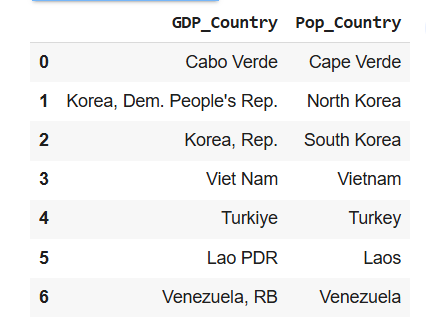

In [ ]:
# ✅ Set up initial unmatched country lists
unmatched_gdp_countries = sorted(unmatched_gdp_countries)
unmatched_pop_countries = sorted(unmatched_pop_countries)
matched_pairs = []

# ✅ Dropdowns
gdp_dropdown = widgets.Dropdown(
    options=unmatched_gdp_countries,
    description='GDP:',
    layout=widgets.Layout(width='50%')
)

pop_dropdown = widgets.Dropdown(
    options=unmatched_pop_countries,
    description='POP:',
    layout=widgets.Layout(width='50%')
)

# ✅ Button to confirm match
match_button = widgets.Button(description="Add Match", button_style='success')

# ✅ Output display for the matched list
output_table = widgets.Output()

# ✅ Action on button click
def add_match(b):
    gdp_val = gdp_dropdown.value
    pop_val = pop_dropdown.value

    # Add to matched list
    matched_pairs.append({'GDP_Country': gdp_val, 'Pop_Country': pop_val})

    # Remove matched items from dropdowns
    unmatched_gdp_countries.remove(gdp_val)
    unmatched_pop_countries.remove(pop_val)

    # Update dropdowns
    gdp_dropdown.options = unmatched_gdp_countries
    pop_dropdown.options = unmatched_pop_countries

    # Show updated matches
    with output_table:
        clear_output()
        display(pd.DataFrame(matched_pairs))

# ✅ Link button to function
match_button.on_click(add_match)

# ✅ Display interface
display(widgets.HBox([gdp_dropdown, pop_dropdown]))
display(match_button)
display(output_table)


Button(button_style='success', description='Add Match', style=ButtonStyle())

Output()

In [ ]:
# Step 1: Convert matched_pairs (list of dicts) to DataFrame
manual_matches_df = pd.DataFrame(matched_pairs)

# Step 2: Add a new column to gdp_2023 with manual matches
# This assumes each unmatched GDP country is only matched once
manual_match_map = dict(zip(manual_matches_df['GDP_Country'], manual_matches_df['Pop_Country']))

# Apply manual mapping where fuzzy match was missing
gdp_2023['Fuzzy_Match_Country'] = gdp_2023['Fuzzy_Match_Country'].fillna(
    gdp_2023['Country Name'].map(manual_match_map)
)

# Step 3: Recreate the "matched" GDP dataset including manual matches
gdp_2023_matched_final = gdp_2023.dropna(subset=['Fuzzy_Match_Country'])

# Step 4: Optional - show total matched countries now
print(f"✅ Total matched countries after manual addition: {len(gdp_2023_matched_final)}")
gdp_2023_matched_final[['Country Name', 'Fuzzy_Match_Country']].head()


✅ Total matched countries after manual addition: 233


,Country Name,Fuzzy_Match_Country
0,Afghanistan,Afghanistan
1,Albania,Albania
2,Algeria,Algeria
3,American Samoa,American Samoa
4,Andorra,Andorra


We can observe that there are 6 new matches after we added the manually-matched countries to the existing dataframe obtained using fuzzywuzzy

Although we know that there are a few countries in thr population 2023 dataset which are missing in the gdp countries, we have to omit them since the further calculation for the GDP Per Capita will require both the varibales

# GDP per Capita Insights

<ipython-input-14-f8858794213a>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdp_2023_matched_final['GDP'] = pd.to_numeric(gdp_2023_matched_final['GDP'], errors='coerce')
<ipython-input-14-f8858794213a>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdp_2023_matched_final['Population_2023'] = pd.to_numeric(gdp_2023_matched_final['Population_2023'], errors='coerce')
<ipython-input-14-f8858794213a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .

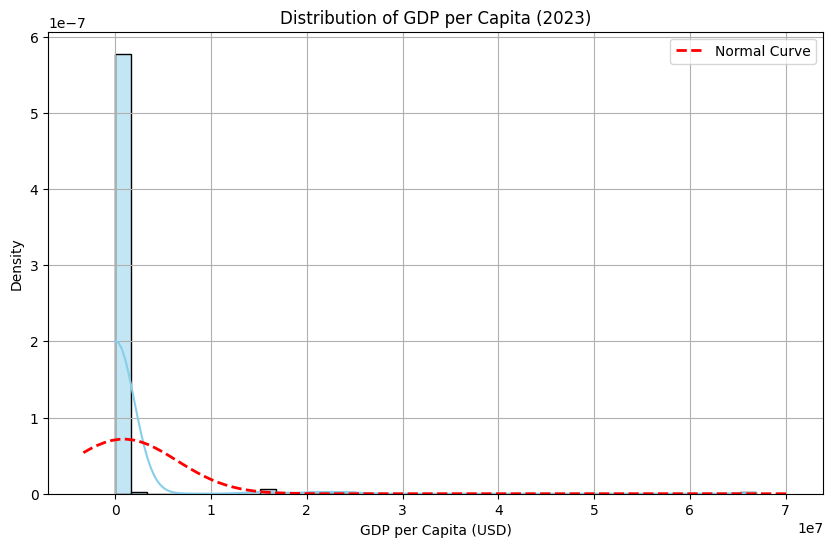

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm

# Make sure GDP per capita is calculated
gdp_2023_matched_final['GDP'] = pd.to_numeric(gdp_2023_matched_final['GDP'], errors='coerce')
gdp_2023_matched_final['Population_2023'] = pd.to_numeric(gdp_2023_matched_final['Population_2023'], errors='coerce')
gdp_2023_matched_final['GDP_per_capita'] = gdp_2023_matched_final['GDP'] / gdp_2023_matched_final['Population_2023']

# Drop NaNs just in case
gdp_per_capita = gdp_2023_matched_final['GDP_per_capita'].dropna()

# Plot the distribution with a KDE + Normal overlay
plt.figure(figsize=(10, 6))
sns.histplot(gdp_per_capita, kde=True, stat='density', bins=40, color='skyblue', edgecolor='black')

# Overlay normal distribution curve
mean = gdp_per_capita.mean()
std = gdp_per_capita.std()
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mean, std)
plt.plot(x, p, 'r--', linewidth=2, label='Normal Curve')

plt.title("Distribution of GDP per Capita (2023)")
plt.xlabel("GDP per Capita (USD)")
plt.ylabel("Density")
plt.legend()
plt.grid(True)
plt.show()


✅ Insights from GDP per Capita Distribution (2023)
Right-Skewed: Most countries have low GDP per capita; only a few are extremely high.

Not Normal: The data deviates from a normal distribution—log transformation is better.

High Inequality: Huge gap between the poorest and richest nations globally.

Outlier Impact: A few rich countries inflate the average; median is a better central measure.

Visualization Tip: Use log scale for clearer patterns and fairer comparisons.

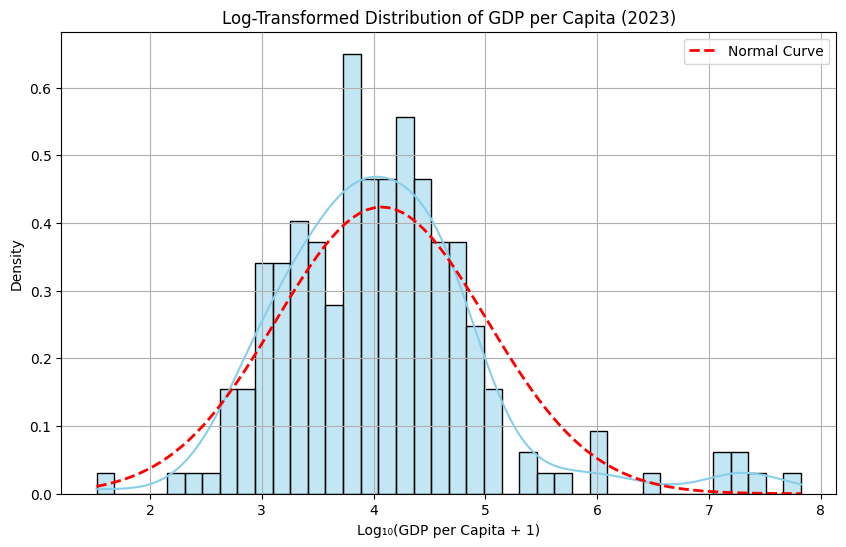

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm

# Ensure numeric and drop missing
gdp_per_capita = pd.to_numeric(gdp_2023_matched_final['GDP_per_capita'], errors='coerce').dropna()

# Apply log10 transformation (add small constant to avoid log(0))
log_gdp_per_capita = np.log10(gdp_per_capita + 1)

# Plot histogram and KDE
plt.figure(figsize=(10, 6))
sns.histplot(log_gdp_per_capita, kde=True, stat='density', bins=40, color='skyblue', edgecolor='black')

# Overlay normal curve
mean = log_gdp_per_capita.mean()
std = log_gdp_per_capita.std()
x = np.linspace(log_gdp_per_capita.min(), log_gdp_per_capita.max(), 100)
p = norm.pdf(x, mean, std)
plt.plot(x, p, 'r--', linewidth=2, label='Normal Curve')

# Labels and legend
plt.title("Log-Transformed Distribution of GDP per Capita (2023)")
plt.xlabel("Log₁₀(GDP per Capita + 1)")
plt.ylabel("Density")
plt.legend()
plt.grid(True)
plt.show()


📊 Insights from the Log-Transformed GDP per Capita Curve (2023)
1. Right-Skewed Distribution
Even after log transformation, the distribution remains slightly right-skewed.

This suggests a long tail of very high-income countries — a small group of countries (like Luxembourg, Singapore, Switzerland) significantly outpace the rest.

2. Most Countries Cluster Around the Center
The peak density lies roughly between log₁₀(GDP per capita) of 3.5 to 4.5, i.e.:

GDP per capita
≈
10
3.5
 to
10
4.5
⇒
$
3
,
160
 to
$
31
,
600
GDP per capita≈10
3.5
  to 10
4.5
 ⇒$3,160 to $31,600
This suggests that most countries fall within low-middle to upper-middle income brackets.

3. Fewer Countries at the Extremes
Very few countries fall below $1,000 or above $100,000 GDP per capita.

This validates the need to log-transform when comparing global income, as raw values distort patterns.

4. Real-World vs Theoretical Normal
The dashed red normal curve doesn’t perfectly fit — especially in the tails.

This indicates that GDP per capita globally is not normally distributed, even after transformation — income distribution tends to follow a log-normal or power-law instead.

In [ ]:
import plotly.express as px
import pandas as pd

# Prepare data: remove 0/NaN and compute GDP per capita if not already
scatter_df = gdp_2023_matched_final.copy()
scatter_df['GDP'] = pd.to_numeric(scatter_df['GDP'], errors='coerce')
scatter_df['Population_2023'] = pd.to_numeric(scatter_df['Population_2023'], errors='coerce')
scatter_df = scatter_df[(scatter_df['GDP'] > 0) & (scatter_df['Population_2023'] > 0)]

# GDP in millions and GDP per capita
scatter_df['GDP_Million_USD'] = scatter_df['GDP'] / 1e6
scatter_df['GDP_per_capita'] = scatter_df['GDP'] / scatter_df['Population_2023']

# Create interactive scatter plot
fig = px.scatter(
    scatter_df,
    x='GDP_Million_USD',
    y='Population_2023',
    hover_name='Country Name',
    hover_data={'GDP_per_capita': ':.2f', 'GDP_Million_USD': ':.0f', 'Population_2023': ':.0f'},
    log_x=True,
    log_y=True,
    title="GDP vs Population (Log-Log, Hover Shows GDP per Capita)",
    labels={
        'GDP_Million_USD': 'GDP (Million USD)',
        'Population_2023': 'Population',
        'GDP_per_capita': 'GDP per Capita'
    },
    template='plotly_white'
)

fig.update_traces(marker=dict(size=8, color='teal', line=dict(width=1, color='black')))
fig.show()


Notice that all of the european countries are least populated and yet have high GDP Per capita where as most of the African countries are heavily populated and yet the averga eincome per houselhold is very less.

*Note that the ideal countries to look upto are the ones wit higher per capita income despite having smaller populations

# World Bank Region Analysis

In [ ]:
gdp_2023_matched_final.head()

,Country Name,Country Code,Year,GDP,Fuzzy_Match_Country,Population_2023,GDP_per_capita
0,Afghanistan,AFG,2023,1.723305e+10,Afghanistan,41454762.0,415.707407
1,Albania,ALB,2023,2.354718e+10,Albania,2811660.0,8374.831890
2,Algeria,DZA,2023,2.476262e+11,Algeria,46164221.0,5364.027718
3,American Samoa,ASM,2023,NaN,American Samoa,47543.0,NaN
4,Andorra,AND,2023,3.785067e+09,Andorra,80868.0,46805.501951


In [ ]:
import requests
import pandas as pd

# ✅ World Bank API endpoint for countries
url = "http://api.worldbank.org/v2/country?format=json&per_page=300"

# Send request and parse JSON
response = requests.get(url)
wb_data = response.json()

# ✅ Convert to DataFrame
wb_countries = pd.DataFrame([{
    'Country Name': c['name'],
    'ISO2': c['id'],
    'Region': c['region']['value'],
    'IncomeLevel': c['incomeLevel']['value'],
    'LendingType': c['lendingType']['value']
} for c in wb_data[1]])

# ✅ Preview
wb_countries.head()

,Country Name,ISO2,Region,IncomeLevel,LendingType
0,Aruba,ABW,Latin America & Caribbean,High income,Not classified
1,Africa Eastern and Southern,AFE,Aggregates,Aggregates,Aggregates
2,Afghanistan,AFG,South Asia,Low income,IDA
3,Africa,AFR,Aggregates,Aggregates,Aggregates
4,Africa Western and Central,AFW,Aggregates,Aggregates,Aggregates


In [ ]:
gdp_with_region = pd.merge(
    gdp_2023_matched_final,
    wb_countries[['Country Name', 'Region']],
    how='left',  # left outer merge
    on='Country Name'
)

In [ ]:
gdp_with_region.head()

,Country Name,Country Code,Year,GDP,Fuzzy_Match_Country,Population_2023,GDP_per_capita,Region
0,Afghanistan,AFG,2023,1.723305e+10,Afghanistan,41454762.0,415.707407,South Asia
1,Albania,ALB,2023,2.354718e+10,Albania,2811660.0,8374.831890,Europe & Central Asia
2,Algeria,DZA,2023,2.476262e+11,Algeria,46164221.0,5364.027718,Middle East & North Africa
3,American Samoa,ASM,2023,NaN,American Samoa,47543.0,NaN,East Asia & Pacific
4,Andorra,AND,2023,3.785067e+09,Andorra,80868.0,46805.501951,Europe & Central Asia


In [ ]:
# Select relevant numeric columns
metrics = ['GDP', 'Population_2023', 'GDP_per_capita']

# Group by Region and aggregate stats
region_stats = gdp_with_region.groupby('Region')[metrics].agg(['max', 'min', 'mean', 'median'])

# Optional: Round for cleaner view
region_stats = region_stats.round(2)

# Display result
region_stats


GDP                              \
                                     max           min          mean   
Region                                                                 
Aggregates                  1.061717e+14  7.991060e+11  1.220272e+13   
East Asia & Pacific         1.779478e+13  6.228031e+07  1.070513e+12   
Europe & Central Asia       4.525704e+12  3.785067e+09  5.194744e+11   
Latin America & Caribbean   2.173666e+12  6.539926e+08  1.831704e+11   
Middle East & North Africa  1.067583e+12  4.098531e+09  2.366044e+11   
North America               2.772071e+13  8.141700e+09  9.957107e+12   
South Asia                  3.567552e+12  6.590894e+09  6.417097e+11   
Sub-Saharan Africa          3.806993e+11  6.789763e+08  4.428144e+10   

                                         Population_2023            \
                                  median             max       min   
Region                                                               
Aggregates                  2.890091e+12    8.091735e+09   93333.0   
East Asia & Pacific         4.406936e+10    1.422585e+09    9837.0   
Europe & Central Asia       1.015918e+11    1.454405e+08   33761.0   
Latin America & Caribbean   2.361156e+10    2.111407e+08   27545.0   
Middle East & North Africa  1.540610e+11    1.145358e+08   29919.0   
North America               2.142471e+12    3.434773e+08   64721.0   
South Asia                  8.435686e+10    1.438070e+09  526009.0   
Sub-Saharan Africa          1.630464e+10    2.278829e+08  127961.0   

                                                     GDP_per_capita            \
                                    mean      median            max       min   
Region                                                                          
Aggregates                  9.176906e+08   3268354.5    66906299.07    434.08   
East Asia & Pacific         1.619901e+08    924150.0       86615.93     32.20   
Europe & Central Asia       1.477089e+07   5519166.0      276938.50   1160.81   
Latin America & Caribbean   1.573275e+07   3040904.0       97726.76   1705.78   
Middle East & North Africa  2.395785e+07  10642089.0      582265.45   3457.46   
North America               1.276137e+08  39299099.0      125796.88  54517.05   
South Asia                  2.440593e+08  35574688.0       12530.00    415.71   
Sub-Saharan Africa          2.467647e+07  14111035.0       16735.18    193.01   

                                                    
                                  mean      median  
Region                                              
Aggregates                  9552485.74  1130859.92  
East Asia & Pacific           15191.21     5922.34  
Europe & Central Asia         42537.01    25495.24  
Latin America & Caribbean     17305.62    12517.61  
Middle East & North Africa    53174.07    13861.33  
North America                 87006.67    80706.08  
South Asia                     3484.66     2480.79  
Sub-Saharan Africa             2727.46     1541.04

In [ ]:
# Function to format large numbers in readable format
def human_format(num):
    if pd.isna(num):
        return ""
    for unit in ['', 'K', 'M', 'B', 'T']:
        if abs(num) < 1000:
            return f"{num:.2f}{unit}"
        num /= 1000
    return f"{num:.2f}P"

# Apply to the region_stats DataFrame (flatten columns for readability first)
region_stats_clean = region_stats.copy()
region_stats_clean.columns = ['_'.join(col).strip() for col in region_stats_clean.columns.values]

# Apply human_format to all numeric values
region_stats_formatted = region_stats_clean.applymap(human_format)

# Display
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

region_stats_formatted


<ipython-input-22-15131ddbdf1c>:16: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



,GDP_max,GDP_min,GDP_mean,GDP_median,Population_2023_max,Population_2023_min,Population_2023_mean,Population_2023_median,GDP_per_capita_max,GDP_per_capita_min,GDP_per_capita_mean,GDP_per_capita_median
Region,,,,,,,,,,,,
Aggregates,106.17T,799.11B,12.20T,2.89T,8.09B,93.33K,917.69M,3.27M,66.91M,434.08,9.55M,1.13M
East Asia & Pacific,17.79T,62.28M,1.07T,44.07B,1.42B,9.84K,161.99M,924.15K,86.62K,32.20,15.19K,5.92K
Europe & Central Asia,4.53T,3.79B,519.47B,101.59B,145.44M,33.76K,14.77M,5.52M,276.94K,1.16K,42.54K,25.50K
Latin America & Caribbean,2.17T,653.99M,183.17B,23.61B,211.14M,27.55K,15.73M,3.04M,97.73K,1.71K,17.31K,12.52K
Middle East & North Africa,1.07T,4.10B,236.60B,154.06B,114.54M,29.92K,23.96M,10.64M,582.27K,3.46K,53.17K,13.86K
North America,27.72T,8.14B,9.96T,2.14T,343.48M,64.72K,127.61M,39.30M,125.80K,54.52K,87.01K,80.71K
South Asia,3.57T,6.59B,641.71B,84.36B,1.44B,526.01K,244.06M,35.57M,12.53K,415.71,3.48K,2.48K
Sub-Saharan Africa,380.70B,678.98M,44.28B,16.30B,227.88M,127.96K,24.68M,14.11M,16.74K,193.01,2.73K,1.54K


**🌍 Regional Insights on GDP, Population & GDP per Capita (2023)**



**1. North America**
💰 Highest mean & median GDP per capita: ~$87K and ~$80K

📈 Extremely high GDP: up to $27.7T

👥 Moderate population (~127M avg), indicating high per-person income



**2. Aggregates**
📊 Includes combined/summary entities (like "World", "OECD", etc.)

⚠️ Not representative of individual countries — interpret separately



**3. Europe & Central Asia**
💵 Second-highest GDP per capita mean: ~$42.5K

🏛️ Wide income range: $1.1K to $276K per capita

👥 Lower population averages (~16M), still economically strong



**4. Middle East & North Africa**
💸 High GDP per capita mean: ~$53.1K (fueled by oil-rich nations)

👥 Median population ~10M — small populations with high national wealth



**5. East Asia & Pacific**
🌏 Most populous region (up to 1.4B in a country)

💵 GDP per capita widely varies: $32 to $86K

💼 Countries like China push GDP values very high ($17.7T max)



**6. South Asia**
👥 Huge populations (avg ~279M)

💸 Lowest average GDP per capita: ~$3.5K

📉 Indicates high population pressure vs moderate national income



**7. Latin America & Caribbean**
⚖️ Moderate GDP per capita: ~$17.3K avg

🏝️ Range shows upper-middle income levels with inequality (min $1.7K, max ~$97K)



**8. Sub-Saharan Africa**
⚠️ Lowest GDP per capita average: ~$2.7K

👥 Moderate population range (up to ~228M)

📉 Indicates developmental challenges and widespread income inequality

# Economic Index

In [ ]:
# Try tab-delimited
economic_index = pd.read_csv('/content/datasets/heritage-index-of-economic-freedom-20250323122350.csv')
economic_index.head()


,Country,Index Year,Overall Score,Property Rights,Government Integrity,Judicial Effectiveness,Tax Burden,Government Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom
0,Afghanistan,2023,NaN,5.8,5.4,12.7,NaN,NaN,NaN,34.6,45.1,NaN,NaN,NaN,NaN
1,Albania,2023,65.3,55.9,49.2,35.5,89.1,71.0,58.2,70.7,49.7,81.3,82.8,70.0,70.0
2,Algeria,2023,43.2,27.8,29.5,28.4,71.9,50.7,12.1,53.6,51.4,75.1,57.5,30.0,30.0
3,Angola,2023,53.0,41.1,24.8,22.9,86.5,86.9,85.1,41.6,53.9,58.9,64.8,30.0,40.0
4,Argentina,2023,51.0,34.6,56.8,42.8,66.9,53.9,33.6,55.5,55.1,36.5,61.2,55.0,60.0


In [ ]:
# Step 1: Filter economic index for 2023
economic_index_2023 = economic_index[economic_index['Index Year'] == 2023].copy()

# Step 2: Merge with GDP Data on country name
gdp_with_econ_index = pd.merge(
    gdp_2023_matched_final,
    economic_index_2023,
    how='left',
    left_on='Fuzzy_Match_Country',
    right_on='Country'
)

# Step 3: Drop duplicate 'Country' column if desired
gdp_with_econ_index.drop(columns=['Country'], inplace=True)

# ✅ Preview the merged DataFrame
gdp_with_econ_index.head()


,Country Name,Country Code,Year,GDP,Fuzzy_Match_Country,Population_2023,GDP_per_capita,Index Year,Overall Score,Property Rights,...,Judicial Effectiveness,Tax Burden,Government Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom
0,Afghanistan,AFG,2023,1.723305e+10,Afghanistan,41454762.0,415.707407,2023.0,NaN,5.8,...,12.7,NaN,NaN,NaN,34.6,45.1,NaN,NaN,NaN,NaN
1,Albania,ALB,2023,2.354718e+10,Albania,2811660.0,8374.831890,2023.0,65.3,55.9,...,35.5,89.1,71.0,58.2,70.7,49.7,81.3,82.8,70.0,70.0
2,Algeria,DZA,2023,2.476262e+11,Algeria,46164221.0,5364.027718,2023.0,43.2,27.8,...,28.4,71.9,50.7,12.1,53.6,51.4,75.1,57.5,30.0,30.0
3,American Samoa,ASM,2023,NaN,American Samoa,47543.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Andorra,AND,2023,3.785067e+09,Andorra,80868.0,46805.501951,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<ipython-input-25-be679abee03d>:24: UserWarning:

Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.



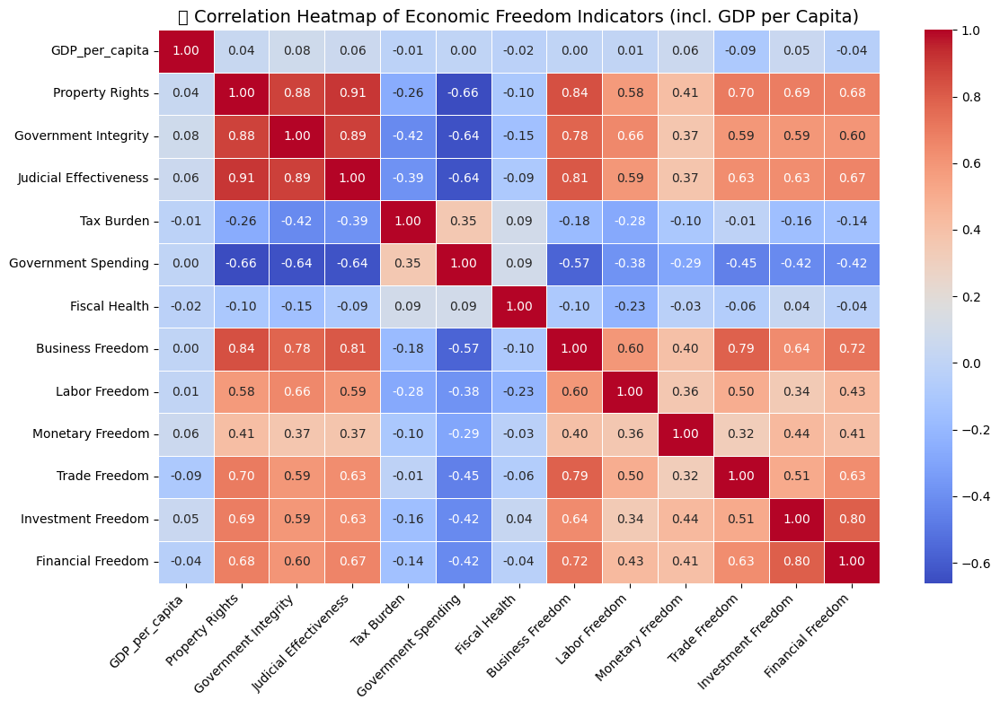

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select relevant columns
econ_corr_data = gdp_with_econ_index[[
    'GDP_per_capita',
    'Property Rights', 'Government Integrity', 'Judicial Effectiveness',
    'Tax Burden', 'Government Spending', 'Fiscal Health',
    'Business Freedom', 'Labor Freedom', 'Monetary Freedom',
    'Trade Freedom', 'Investment Freedom', 'Financial Freedom'
]]

# Drop rows with missing values
econ_corr_data = econ_corr_data.dropna()

# Compute correlation matrix
corr_matrix = econ_corr_data.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("📈 Correlation Heatmap of Economic Freedom Indicators (incl. GDP per Capita)", fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


🔍 **Important Correlation Insights:**


**Strong Internal Correlations:**

Property Rights, Judicial Effectiveness, and Government Integrity are all highly correlated (≥ 0.88), forming a governance strength cluster.

**Business Freedom is a Hub:**

Strongly correlates with Property Rights (0.84), Judicial Effectiveness (0.81), and Financial Freedom (0.72) — vital for enabling economic activities.

**Weak Link to GDP per Capita:**

Surprisingly, GDP per capita has weak correlations with all indicators, suggesting other external or structural factors may drive income levels.

**Negative Correlation with Government Spending:**

Government Spending is negatively correlated with most other indicators (up to -0.66 with Judicial Effectiveness), hinting at potential trade-offs in fiscal-heavy systems.

**Financial Ecosystem is Cohesive:**

Investment, Trade, and Financial Freedom are all strongly interconnected (≥ 0.80), showing a tight-knit capital market dimension.

In [ ]:
!pip uninstall -y pandas-profiling
!pip install ydata-profiling --quiet

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 30.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 81.6 MB/s eta 0:00:00


In [ ]:
from ydata_profiling import ProfileReport

# Subset for profiling
profile_data = gdp_with_econ_index[[
    'Country Name', 'GDP_per_capita',
    'Property Rights', 'Government Integrity', 'Judicial Effectiveness',
    'Tax Burden', 'Government Spending', 'Fiscal Health', 'Business Freedom',
    'Labor Freedom', 'Monetary Freedom', 'Trade Freedom',
    'Investment Freedom', 'Financial Freedom'
]].dropna()

# Generate the report
profile = ProfileReport(profile_data, title="📊 Economic Freedom Index Profiling", explorative=True)

# Show in notebook
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 14/14 [00:00<00:00, 41.23it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Key findings:

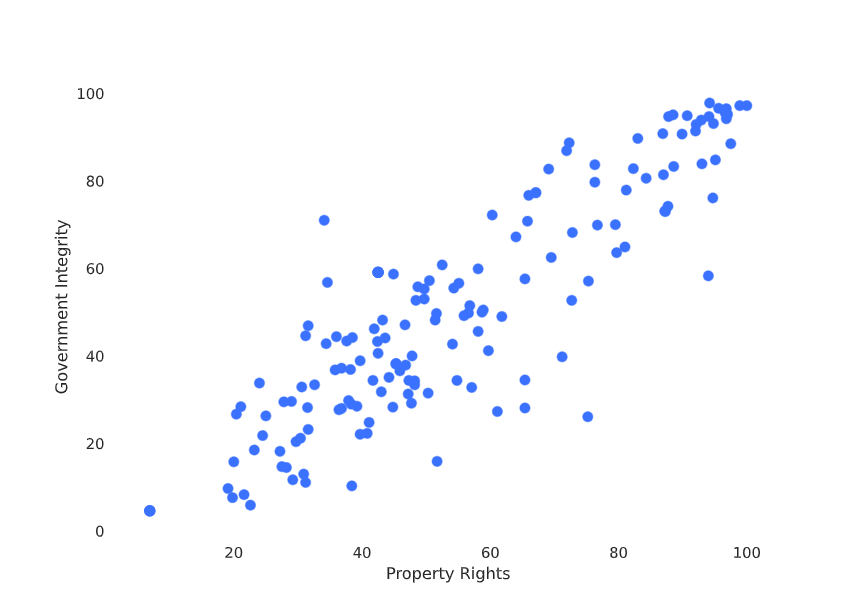


2.
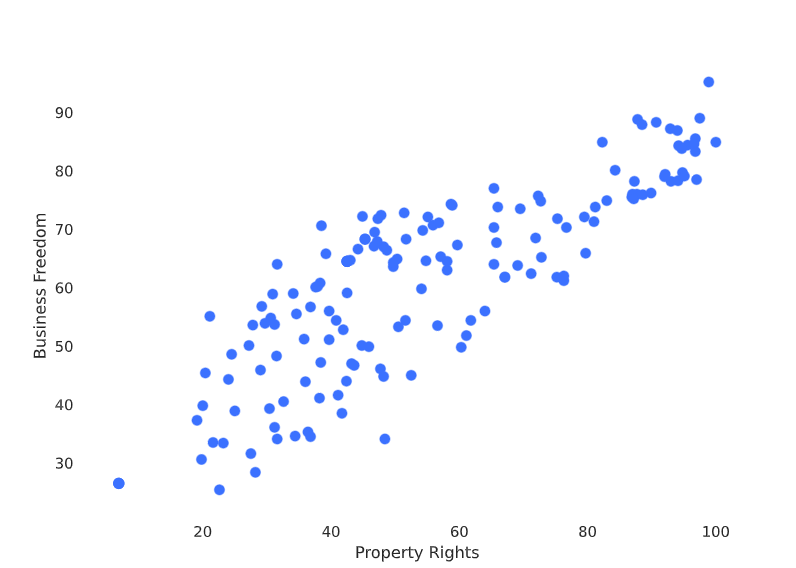


3. 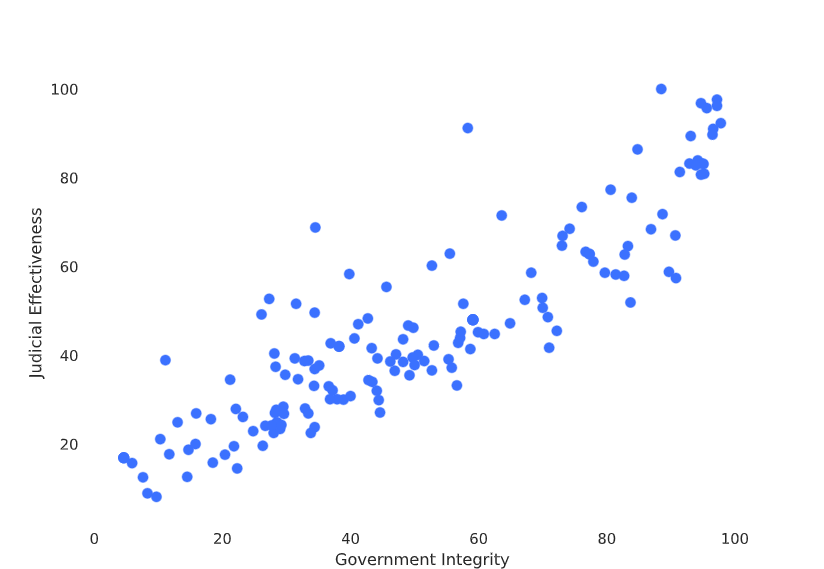


4. 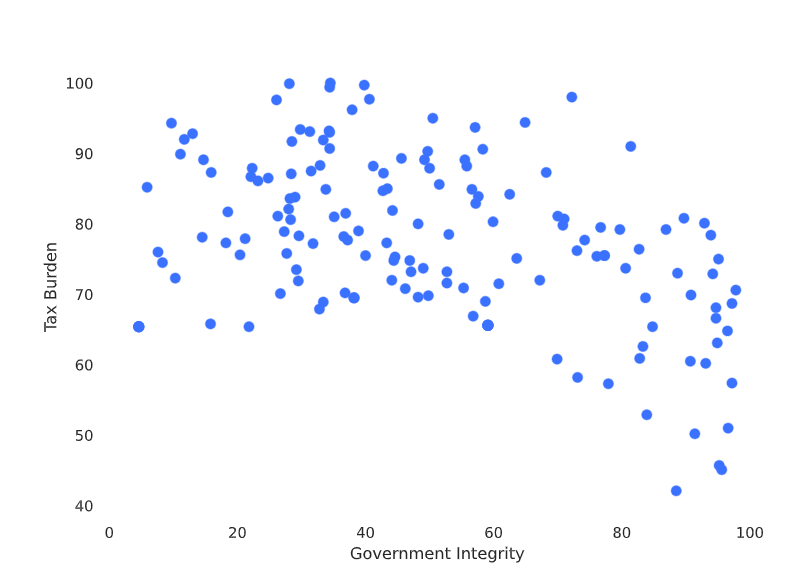


5. 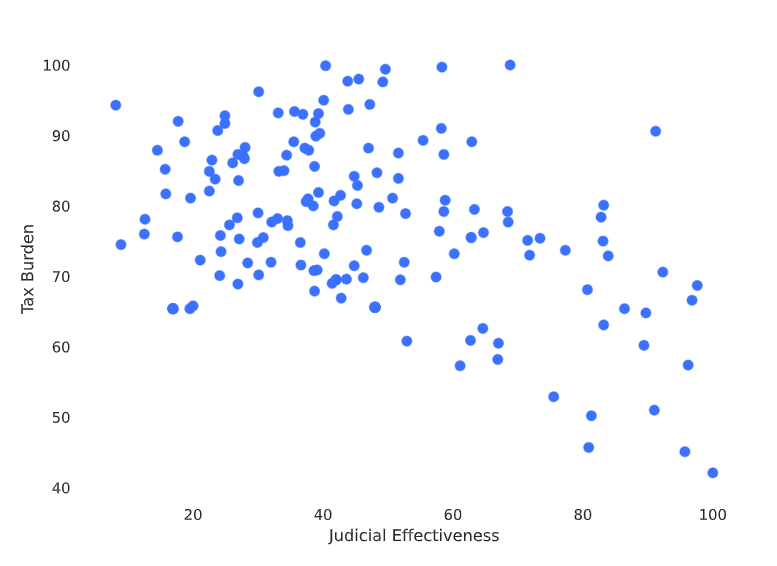


6. 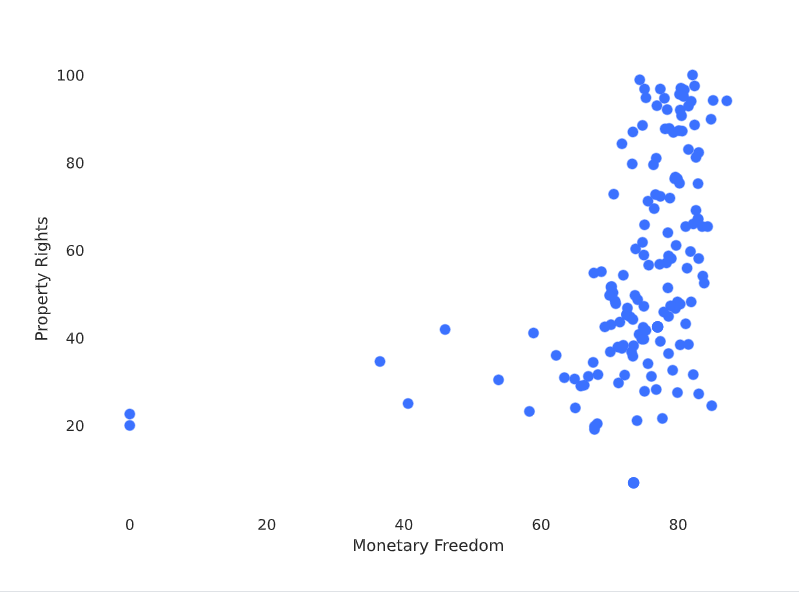

# Identifying Economic Clusters using Agglomerative Clustering

In [ ]:
gdp_with_econ_index.columns.tolist()

['Country Name',
 'Country Code',
 'Year',
 'GDP',
 'Fuzzy_Match_Country',
 'Population_2023',
 'GDP_per_capita',
 'Index Year',
 'Overall Score',
 'Property Rights',
 'Government Integrity',
 'Judicial Effectiveness',
 'Tax Burden',
 'Government Spending',
 'Fiscal Health',
 'Business Freedom',
 'Labor Freedom',
 'Monetary Freedom',
 'Trade Freedom',
 'Investment Freedom',
 'Financial Freedom']

In [ ]:
econ_features = [
    'Property Rights', 'Government Integrity', 'Judicial Effectiveness',
    'Tax Burden', 'Government Spending', 'Fiscal Health', 'Business Freedom',
    'Labor Freedom', 'Monetary Freedom', 'Trade Freedom',
    'Investment Freedom', 'Financial Freedom'
]

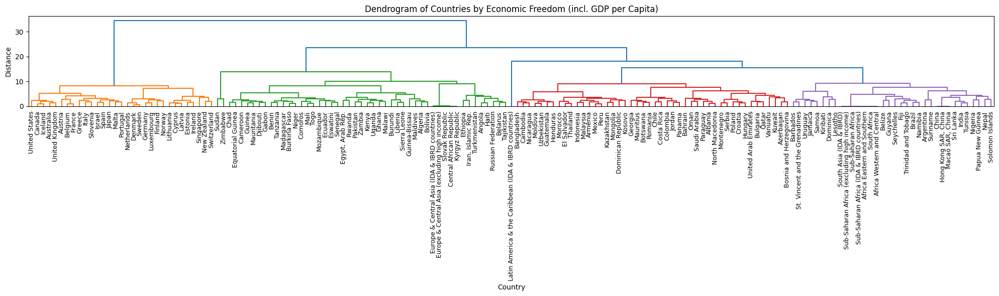

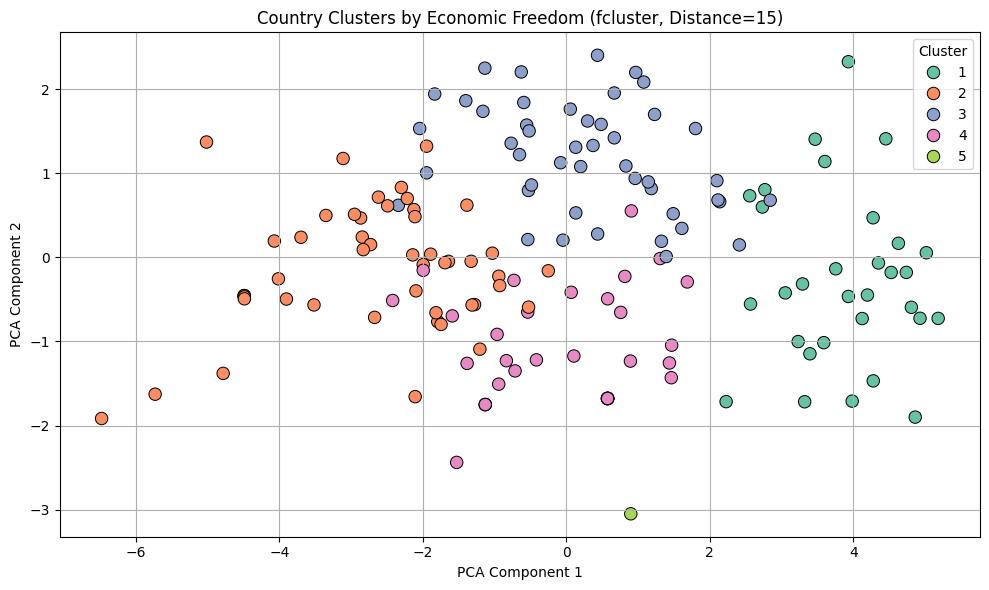

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Define economic features (including GDP per capita)
econ_features = [
    'GDP_per_capita',
    'Property Rights', 'Government Integrity', 'Judicial Effectiveness',
    'Tax Burden', 'Government Spending', 'Fiscal Health', 'Business Freedom',
    'Labor Freedom', 'Monetary Freedom', 'Trade Freedom',
    'Investment Freedom', 'Financial Freedom'
]

# 1. Filter and scale
econ_cluster_df = gdp_with_econ_index.dropna(subset=econ_features).copy()
scaler = StandardScaler()
X_scaled = scaler.fit_transform(econ_cluster_df[econ_features])

# 2. Create linkage matrix
linkage_matrix = linkage(X_scaled, method='ward')

# 3. Extract clusters using fcluster at custom distance threshold
econ_cluster_df['Dendro_Cluster'] = fcluster(linkage_matrix, t=15, criterion='distance')

# 4. PCA for 2D visualization
pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_scaled)
econ_cluster_df['PCA1'] = pca_components[:, 0]
econ_cluster_df['PCA2'] = pca_components[:, 1]

# 5. Visualize dendrogram (optional)
plt.figure(figsize=(20, 6))
dendrogram(
    linkage_matrix,
    labels=econ_cluster_df['Country Name'].values,
    leaf_rotation=90,
    leaf_font_size=9,
    color_threshold=15  # <-- Cut-off for cluster coloring
)
plt.title('Dendrogram of Countries by Economic Freedom (incl. GDP per Capita)')
plt.xlabel('Country')
plt.ylabel('Distance')
plt.tight_layout()
plt.show()

# 6. Visualize cluster scatterplot
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=econ_cluster_df,
    x='PCA1', y='PCA2',
    hue='Dendro_Cluster', palette='Set2', s=80, edgecolor='k'
)
plt.title("Country Clusters by Economic Freedom (fcluster, Distance=15)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster")
plt.grid(True)
plt.tight_layout()
plt.show()


🌍 **Dendrogram Clustering Insights:**

**High-Economic-Freedom Cluster:**

Countries like the United States, Switzerland, Germany, Canada, and Singapore cluster together.

These exhibit strong institutions, high GDP per capita, and robust market freedoms.

**Emerging Economies Group:**

Nations such as India, Indonesia, Vietnam, and Philippines are in a distinct mid-tier cluster.

Characterized by moderate economic freedom and growing but uneven development.

**Resource-Rich Yet Restrictive Cluster:**

Countries like Russia, Saudi Arabia, and Iran group together.

These often have lower political/economic freedoms but resource-driven GDP.

**Low-Income/Low-Freedom Cluster:**

Many Sub-Saharan African and fragile states (e.g., Chad, Haiti, Sudan) appear in a separate cluster.

Defined by weak institutions, low GDP per capita, and limited economic opportunity.

**Policy Insight:**

Clustering suggests GDP alone doesn’t define similarity — freedoms and governance quality play a crucial role in economic similarity.

📊 **PCA-Based Economic Clusters (5 Groups)**


**Cluster 1 (Green**) – High-performing countries

Likely includes developed nations with strong scores across most indicators and high GDP per capita.

**Cluster 2 (Orange)** – Low economic freedom & weaker scores

Consists of countries with lower institutional quality and limited financial freedoms.

**Cluster 3 (Pink)** – Emerging/transitioning economies

Countries with moderate performance and reform potential; may include some Eastern European, South Asian, or Latin American nations.

**Cluster 4 (Blue)** – Balanced economies with moderate freedom

Economies that are not highly developed but show institutional consistency.

**Cluster 5 (Light Green, sparse)** – Unique outliers, only one country

Small in number, these are countries with unusual or extreme profiles (e.g., high GDP but low freedoms, or vice versa).

🔍 **Major Differences:**

**Cross-Region Groupings**

Countries from different regions (e.g., Chile and Estonia) may cluster together economically due to similar market freedoms.

**Intra-Region Differences**

Countries within the same region (e.g., Sub-Saharan Africa) can fall into multiple clusters based on their performance and institutions.

**Objective vs Subjective**

World Bank regions are fixed.

Clusters here are data-driven, potentially offering better insight into economic similarity than geography alone.

**Policy Implication**

Clustering by economics allows for targeted policy benchmarking, while regional classification is more useful for diplomatic and aid distribution purposes.

**Outliers Captured**

Your clustering identifies economic outliers (e.g., Singapore, UAE) that geography-based grouping would overlook.

# Countries similar to India

In [ ]:
# Find India's cluster
india_cluster = econ_cluster_df.loc[econ_cluster_df['Country Name'] == 'India', 'Dendro_Cluster'].iloc[0]

# Get all countries in the same cluster as India
countries_with_india = econ_cluster_df[econ_cluster_df['Dendro_Cluster'] == india_cluster]

# Display the countries
countries_with_india_list = countries_with_india[['Country Name']]
print(countries_with_india_list)


                                   Country Name
7                                     Argentina
16                                     Barbados
19                                       Belize
26                                       Brazil
41                                        China
55                                     Dominica
66                                         Fiji
83                                       Guyana
86                         Hong Kong SAR, China
89                                        India
97                                      Jamaica
102                                    Kiribati
111                                     Lesotho
117                            Macao SAR, China
135                                     Namibia
137                                       Nepal
143                                     Nigeria
151                            Papua New Guinea
162                                       Samoa
168                                  Sey

​India's unique blend of democratic governance, a mixed economy, and active participation in international organizations aligns it with several countries that share similar orientations. Here are some nations with comparable political and economic frameworks:​

In [ ]:
countries_similar_to_india = [
    "Brazil", "South Africa", "Indonesia", "Mexico", "Turkey",
    "Egypt", "Malaysia", "Philippines", "Thailand", "Vietnam",
    "Argentina", "Nigeria", "Kenya", "Colombia", "Peru",
    "Chile", "Bangladesh", "Sri Lanka", "Morocco", "Tunisia",
    "Ghana", "Ethiopia", "Pakistan", "Uruguay", "Nepal",
    "Tanzania", "Zambia", "Botswana", "Costa Rica", "Ecuador"
]

In [ ]:
import pandas as pd

countries_similar_to_india = [
    "Brazil", "South Africa", "Indonesia", "Mexico", "Turkey",
    "Egypt", "Malaysia", "Philippines", "Thailand", "Vietnam",
    "Argentina", "Nigeria", "Kenya", "Colombia", "Peru",
    "Chile", "Bangladesh", "Sri Lanka", "Morocco", "Tunisia",
    "Ghana", "Ethiopia", "Pakistan", "Uruguay", "Nepal",
    "Tanzania", "Zambia", "Botswana", "Costa Rica", "Ecuador", "India"
]

# Use your loaded dataframes directly, e.g., df4, df5, df6 as provided by Colab file loader.
latest_hdi = df4_hdi.sort_values('Year').drop_duplicates('Entity', keep='last')[['Entity', 'Human Development Index']]
latest_gini = df5_gini.sort_values('Year').drop_duplicates('Entity', keep='last')[['Entity', 'Gini coefficient']]
latest_econ_freedom = economic_index_2023[['Country', 'Overall Score']]

# Merging datasets
merged_df = pd.DataFrame({'Country': countries_similar_to_india})

merged_df = merged_df.merge(latest_hdi, left_on='Country', right_on='Entity', how='left').drop('Entity', axis=1)
merged_df = merged_df.merge(latest_gini, left_on='Country', right_on='Entity', how='left').drop('Entity', axis=1)
merged_df = merged_df.merge(latest_econ_freedom, left_on='Country', right_on='Country', how='left')

merged_df.columns = ['Country', 'HDI', 'Gini Coefficient', 'Economic Freedom Score']
merged_df.fillna('n/a', inplace=True)

# Display resulting DataFrame
print(merged_df)


         Country    HDI Gini Coefficient Economic Freedom Score
0         Brazil  0.760              n/a                   53.5
1   South Africa  0.717              n/a                   55.7
2      Indonesia  0.713          0.36057                   63.5
3         Mexico  0.781              n/a                   63.2
4         Turkey  0.855              n/a                    n/a
5          Egypt  0.728              n/a                   49.6
6       Malaysia  0.807              n/a                   67.3
7    Philippines  0.710              n/a                    n/a
8       Thailand  0.803              n/a                   60.6
9        Vietnam  0.726              n/a                   61.8
10     Argentina  0.849              n/a                   51.0
11       Nigeria  0.548              n/a                   53.9
12         Kenya  0.601              n/a                   52.5
13      Colombia  0.758              n/a                   63.1
14          Peru  0.762              n/a

<ipython-input-39-73e8654f313b>:25: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'n/a' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



In [ ]:
# Ensure numeric conversion for HDI and Economic Freedom Score columns
merged_df['HDI'] = pd.to_numeric(merged_df['HDI'], errors='coerce')
merged_df['Economic Freedom Score'] = pd.to_numeric(merged_df['Economic Freedom Score'], errors='coerce')

# Extract India's HDI and Economic Freedom Score as benchmarks
india_row = merged_df[merged_df['Country'] == 'India']
if not india_row.empty:
    india_hdi = india_row['HDI'].iloc[0]
    india_efs = india_row['Economic Freedom Score'].iloc[0]
else:
    india_hdi, india_efs = None, None

# Filter for countries with both metrics strictly greater than India's values (excluding India)
better_than_india = merged_df[
    (merged_df['HDI'] > india_hdi) &
    (merged_df['Economic Freedom Score'] > india_efs) &
    (merged_df['Country'] != 'India')
]

# Display the filtered DataFrame
print("\nCountries with better HDI and Economic Freedom Score than India:")
print(better_than_india)



Countries with better HDI and Economic Freedom Score than India:
         Country    HDI Gini Coefficient  Economic Freedom Score
0         Brazil  0.760              n/a                    53.5
1   South Africa  0.717              n/a                    55.7
2      Indonesia  0.713          0.36057                    63.5
3         Mexico  0.781              n/a                    63.2
6       Malaysia  0.807              n/a                    67.3
8       Thailand  0.803              n/a                    60.6
9        Vietnam  0.726              n/a                    61.8
13      Colombia  0.758              n/a                    63.1
14          Peru  0.762              n/a                    66.5
15         Chile  0.860              n/a                    71.1
16    Bangladesh  0.670              n/a                    54.4
18       Morocco  0.698              n/a                    58.4
23       Uruguay  0.830              n/a                    70.2
27      Botswana  0.708 

# Conclusion and Discussion

Below are several policy suggestions—rooted in economic freedom—that have helped countries on your list boost their GDP per capita. These suggestions reference concrete reforms and initiatives implemented in some of these nations:


**Streamline Regulations & Reduce Bureaucracy**

Brazil: Introduced reforms that simplified business registration and reduced bureaucratic red tape, making it easier for private enterprises to start and operate.

Indonesia: Pursued decentralization policies that allowed local governments to cut through centralized red tape, fostering a more agile regulatory environment.


**Strengthen Property Rights & Contract Enforcement**

Indonesia: Enhanced legal frameworks for property rights, ensuring that investors and entrepreneurs have confidence that their assets and contracts are secure.

Mexico: Improved judicial efficiency in commercial disputes, reinforcing investor trust and encouraging domestic and foreign investments.


**Implement Tax Reforms and Fiscal Discipline**

Mexico: Carried out tax reforms aimed at lowering the tax burden and simplifying tax codes, which helped increase disposable income for businesses and individuals, thereby driving private-sector growth.

Brazil: Adopted fiscal reforms to modernize its tax system and reduce compliance costs, indirectly supporting economic dynamism.


**Liberalize Trade & Encourage Foreign Direct Investment (FDI)**

Indonesia: Reduced trade barriers and streamlined customs procedures, which not only improved export competitiveness but also attracted FDI, bolstering overall economic performance.

Mexico: Engaged in comprehensive trade liberalization—including multiple free trade agreements—to integrate its economy more fully into global markets, thus enhancing GDP per capita through increased exports and technology transfer.

Bangladesh: Created an investor-friendly environment, particularly for export-oriented industries, by easing restrictions and promoting microfinance, which has stimulated private enterprise and boosted economic growth.


**Invest in Infrastructure and Market-Driven Reforms**

Brazil & Chile: Made significant investments in infrastructure (transport, energy, and communications) to lower transaction costs and attract both domestic and international investments. These improvements help create a more efficient market and raise GDP per capita over time.


By focusing on these reforms—simplifying regulations, safeguarding property rights, reforming taxes, liberalizing trade, and investing in infrastructure—countries have improved economic freedom, which in turn has contributed to higher GDP per capita. These measures have been key in creating a vibrant, market-driven environment that India could look to for inspiration and potential policy adaptation.

**Information on other Countries and Their Policy Reforms suitable for India**


**Singapore**

**Regulatory Efficiency & Ease of Doing Business:**
Singapore is renowned for its highly efficient regulatory framework, minimal bureaucracy, and robust legal protections for investors.

**Key Policy Measures:**

Digital government services that streamline administrative processes.

Transparent and effective legal system to enforce property rights and contracts.

Strategic public-private partnerships to enhance competitiveness.



**South Korea**

**Innovation & Export-Led Growth:**
South Korea transformed its economy through aggressive investments in technology, education, and research & development (R&D).

**Key Policy Measures:**

Policies encouraging innovation and high-tech manufacturing.

Export-oriented industrial policies combined with strong government support for strategic industries.

Workforce upskilling and vocational training programs to support a dynamic labor market.



**New Zealand**

**Transparent Regulatory Framework:**
Known for its minimal regulatory hurdles, New Zealand creates a business-friendly environment that promotes entrepreneurship and investment.

**Key Policy Measures:**

Simplified business registration and licensing procedures.

A transparent regulatory system that minimizes corruption and promotes accountability.

Reforms that continuously adapt to changing economic conditions to remain competitive on a global scale.



**Taiwan**

**Innovation and Technology-Driven Growth:**
Taiwan has built a strong, innovation-led economy through close collaboration between government and industry, making it a hub for high-tech industries.

**Key Policy Measures:**

Supportive policies for R&D and technology commercialization.

Strategic investments in education and skills development tailored to emerging industries.

Incentives for startups and technology companies to foster a vibrant innovation ecosystem.

**References**

**World Bank Doing Business Reports**
Explore comprehensive reports and data on regulatory reforms and ease of doing business (including case studies on Singapore and New Zealand):
https://www.doingbusiness.org/en/reports

**The Economist**
For articles and analyses on South Korea’s economic transformation and innovation-led growth, try searching for relevant articles here:
https://www.economist.com/search?q=South+Korea+economic+transformation

**OECD Reports**
Find studies and reports on regulatory reforms and best practices in economic policy (including insights on South Korea and New Zealand) at:
https://www.oecd.org/regulatory-policy/

**Harvard Business Review**
Look for detailed discussions on Taiwan’s innovation-driven economy and related policies by exploring HBR’s search results:
https://hbr.org/search?term=Taiwan+innovation


These resources provide in-depth analyses and case studies that highlight how these nations’ reforms have helped drive economic growth and improved quality of life. India's policymakers can study these models to design reforms that boost economic freedom, foster innovation, and ultimately raise GDP per capita.

**Limitations**

When India considers adopting policy reforms or regulatory practices from other nations, several limitations or challenges may arise due to differences in context, institutions, and socio-economic conditions. Here are some key limitations:

1. **Contextual Differences**

**Demographics & Diversity:**
India's large, diverse population differs significantly from smaller, more homogeneous countries like Singapore or New Zealand. Policies that work in a city-state or a relatively uniform society may need major adjustments to suit India's varied cultural, linguistic, and regional landscapes.

**Economic Structure:**
While some economies are driven by high-tech manufacturing or services, India has a significant informal sector and a vast agricultural base. Reforms must be adapted to ensure they address the needs of a broad spectrum of economic activities.

2. **Institutional and Governance Challenges**

**Bureaucratic Complexity:**
India’s multi-layered bureaucracy and regulatory framework can impede swift implementation of reforms. Streamlining procedures, as seen in some of the reference countries, may be more challenging due to entrenched administrative practices.

**Federal Structure:**
Unlike more centralized governance models (e.g., Singapore), India’s federal system means that states have significant autonomy. Coordinating reforms across different state governments with varying priorities can be difficult.

3. **Resource Constraints and Infrastructure**

**Digital and Physical Infrastructure:**
Countries like Singapore and South Korea have invested heavily in world-class digital and physical infrastructure. Replicating such investments requires substantial resources and long-term planning, which might be challenging for a developing economy with competing priorities.

**Human Capital Development:**
High levels of education and specialized skills support the rapid uptake of innovative policies in some countries. While India is making progress in education and skill development, there remains a gap that can slow down the effective implementation of new reforms.

4. **Legal and Regulatory Frameworks**

**Property Rights and Contract Enforcement:**
Many of the reforms depend on robust legal frameworks that ensure property rights and enforce contracts swiftly. India’s legal system is still evolving in these areas, and judicial delays or inconsistencies can hinder policy effectiveness.

**Adaptability of Reforms:**
Policies designed in one legal and regulatory context may not translate directly into another. Customization to local conditions is essential, and there can be resistance to change among stakeholders accustomed to existing practices.

5. **Political and Social Considerations**

**Political Will and Consensus:**
Implementing sweeping reforms requires strong political consensus and sustained effort over time. In a diverse political landscape, achieving this consensus can be challenging.

**Public Acceptance:**
Reforms, especially those affecting taxation or social welfare, may face resistance from sections of society that perceive them as threats to established benefits or livelihoods.



In [ ]:
# Step 1: Download the notebook using its file ID
!gdown --id 1iCpQFpXb9_GlX_i5TCgM_tmofHSBnYjN -O my_notebook.ipynb

# Step 2: Update the notebook metadata to fix missing "state" keys in widgets metadata
import nbformat

notebook_path = 'my_notebook.ipynb'
with open(notebook_path, 'r', encoding='utf-8') as f:
    nb = nbformat.read(f, as_version=nbformat.NO_CONVERT)

# Check for widgets metadata and add missing "state" keys if needed
if 'widgets' in nb.get('metadata', {}):
    widget_meta = nb['metadata']['widgets']
    # widget_meta should be a dict with one or more mime-type keys; update each one
    for key in widget_meta:
        if isinstance(widget_meta[key], dict) and 'state' not in widget_meta[key]:
            widget_meta[key]['state'] = {}  # add an empty state
    nb['metadata']['widgets'] = widget_meta
else:
    print("No widgets metadata found. Nothing to update.")

# Write the updated notebook back to file
with open(notebook_path, 'w', encoding='utf-8') as f:
    nbformat.write(nb, f)

print("Notebook metadata updated successfully. You can now open 'my_notebook.ipynb' in Colab.")



/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1iCpQFpXb9_GlX_i5TCgM_tmofHSBnYjN
To: /content/my_notebook.ipynb
100% 1.97M/1.97M [00:00<00:00, 145MB/s]
Notebook metadata updated successfully. You can now open 'my_notebook.ipynb' in Colab.
